# Plot single-cell doubling times

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from tqdm.auto import tqdm

from macrohet import plot

# Setup
sns.set(style="white", font="Nimbus Sans")
sns.set_palette(['#1a9641', '#a6d96a', '#978897', '#d1d1ca', '#f1b6da', '#d02c91'])
plt.rcParams["axes.spines.right"] = False
plt.rcParams["axes.spines.top"] = False

### Load single-cell data

#### Using CSV

In [12]:
csv_path = "../data/single_cell_df.csv"
df = pd.read_csv(csv_path, index_col=0)
df

,Time (hours),Mtb Area (µm),dMtb Area (µm),Mphi Area (µm),dMphi Area (µm),Infection Status,Initial Infection Status,Final Infection Status,x,y,...,Uptake,dMtb Area between frames (µm),Mtb Area Processed (µm),Time Model (hours),Mtb Area Model (µm),mtb_origin,Doubling Amounts,Doubling Times,r2,Frame
405,0.0,46.797680,136.772588,660.776979,-68.386294,NaN,1.0,1.0,519.922607,876.779602,...,False,NaN,NaN,NaN,NaN,Growth,"[50.6, 101.2]",[28.0],0.97,0
406,1.0,48.719647,136.772588,585.105086,-68.386294,NaN,1.0,1.0,522.290833,876.766357,...,False,1.921968,NaN,NaN,NaN,Growth,"[50.6, 101.2]",[28.0],0.97,1
407,2.0,52.206007,136.772588,582.020998,-68.386294,True,1.0,1.0,524.336243,874.563110,...,False,3.486360,NaN,2.0,47.625714,Growth,"[50.6, 101.2]",[28.0],0.97,2
408,3.0,50.552221,136.772588,572.232372,-68.386294,True,1.0,1.0,516.952454,876.656799,...,False,-1.653786,NaN,3.0,49.099089,Growth,"[50.6, 101.2]",[28.0],0.97,3
409,4.0,54.463202,136.772588,590.669853,-68.386294,True,1.0,1.0,521.947449,880.909363,...,False,3.910981,50.552221,4.0,50.593160,Growth,"[50.6, 101.2]",[28.0],0.97,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1089728,70.0,0.000000,0.000000,1060.881495,-36.539736,False,0.0,0.0,599.478394,769.336914,...,False,0.000000,0.000000,70.0,0.000000,Junk,NaN,NaN,-0.01,70
1089729,71.0,8.872339,0.000000,937.205106,-36.539736,False,0.0,0.0,594.419922,769.042297,...,False,8.872339,0.000000,71.0,0.000000,Junk,NaN,NaN,-0.01,71
1089730,72.0,0.000000,0.000000,1189.988561,-36.539736,False,0.0,0.0,604.841675,773.028931,...,False,-8.872339,0.000000,72.0,0.000000,Junk,NaN,NaN,-0.01,72
1089731,73.0,0.000000,0.000000,975.934991,-36.539736,NaN,0.0,0.0,600.207642,771.466614,...,False,0.000000,0.000000,NaN,NaN,Junk,NaN,NaN,-0.01,73


In [25]:
pickle_path = '/Volumes/OPERA3/Nathan/previously_transferred_needs_reorg/OPERA2/Nathan_from_OPERA2/macrohet_syno/results/dfs/sc_df.ND0004_update.pkl'
df = pd.read_pickle(pickle_path)
df

,Time (hours),Mtb Area (µm),dMtb Area (µm),Mphi Area (µm),dMphi Area (µm),Infection Status,Initial Infection Status,Final Infection Status,x,y,...,dMtb Area between frames (µm),Mtb Area Processed (µm),Time Model (hours),Mtb Area Model (µm),mtb_origin,Doubling Amounts,Doubling Times,r2,Frame,category_rank
0,0.0,0.000000,0.0,4649.351562,2080.574775,NaN,0.0,0.0,107.845200,755.241882,...,NaN,NaN,NaN,NaN,None,None,None,1.0,0,NaN
1,0.5,0.000000,0.0,4973.001953,2080.574775,NaN,0.0,0.0,113.264671,764.392212,...,0.0,NaN,NaN,NaN,None,None,None,1.0,1,NaN
2,1.0,0.000000,0.0,4687.857910,2080.574775,NaN,0.0,0.0,116.562256,767.332825,...,0.0,NaN,NaN,NaN,None,None,None,1.0,2,NaN
3,1.5,0.000000,0.0,4209.064453,2080.574775,NaN,0.0,0.0,111.890106,758.421265,...,0.0,NaN,NaN,NaN,None,None,None,1.0,3,NaN
4,2.0,0.000000,0.0,4061.855225,2080.574775,False,0.0,0.0,114.113556,759.828735,...,0.0,NaN,0.0,0.000000,None,None,None,1.0,4,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
604938,74.5,1.318559,0.0,465.719601,-259.532690,1.0,0.0,0.0,199.740707,530.029724,...,NaN,3.754542,70.0,3.831754,NaN,None,None,0.92,149,8.0
604939,75.0,0.000000,0.0,392.506040,-259.532690,0.0,0.0,0.0,200.346191,529.733398,...,NaN,2.771209,70.5,3.993013,NaN,None,None,0.92,150,8.0
604940,75.5,0.000000,0.0,410.295415,-259.532690,0.0,0.0,0.0,200.246902,528.299072,...,NaN,3.285224,71.0,4.152034,NaN,None,None,0.92,151,8.0
604941,76.0,0.000000,0.0,463.708240,-259.532690,0.0,0.0,0.0,200.559875,529.950134,...,NaN,5.251889,71.5,4.311997,NaN,None,None,0.92,152,8.0


#### Using Zarr

In [ ]:
# Load from zarr or pickle
zarr_path = "../data/single_cell_df.zarr"
df = pd.read_zarr(zarr_path) 

#### Filter out unreliable tracks


In [13]:
df = df[df['r2'] > 0.7]

### Plot individual growth dynamics graph
To inspect the LOWESS fit

Plotting growth curves:   0%|          | 0/3 [00:00<?, ?it/s]

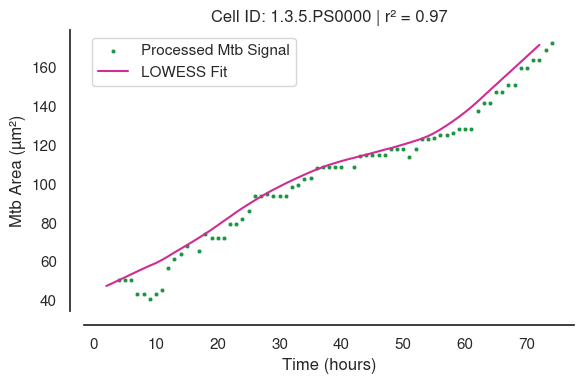

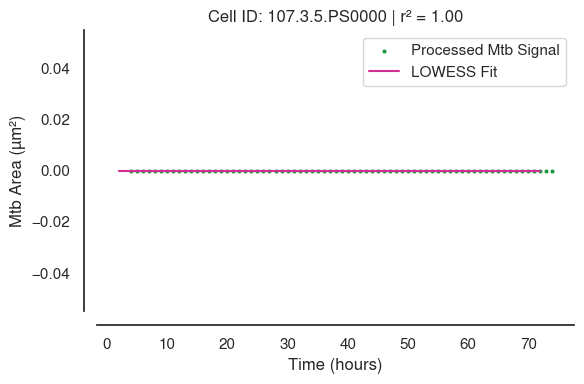

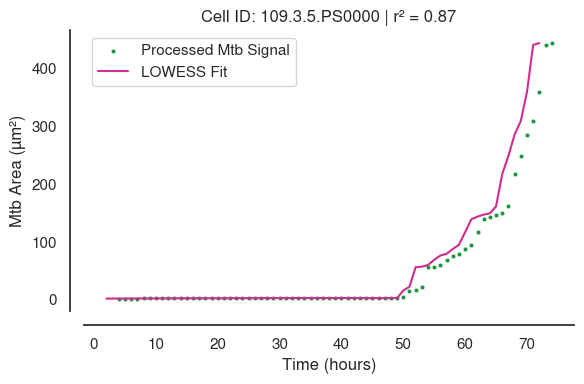

In [19]:
# Choose a subset to plot
example_ids = df['ID'].dropna().unique()[:3]

# Plot
for ID in tqdm(example_ids, desc="Plotting growth curves"):
    sc_df = df[df['ID'] == ID].sort_values(by='Time Model (hours)')

    plt.figure(figsize=(6, 4))
    sns.scatterplot(data=sc_df, x='Time (hours)', y='Mtb Area Processed (µm)', label='Processed Mtb Signal', s=10)
    sns.lineplot(data=sc_df, x='Time Model (hours)', y='Mtb Area Model (µm)', label='LOWESS Fit', color='#d02c91')

    plt.title(f"Cell ID: {ID} | r² = {sc_df['r2'].iloc[0]:.2f}")
    plt.xlabel("Time (hours)")
    plt.ylabel("Mtb Area (µm²)")
    plt.grid(False)
    sns.despine(offset=10)
    plt.tight_layout()
    plt.show()


### Plot with doubling time quantifications 

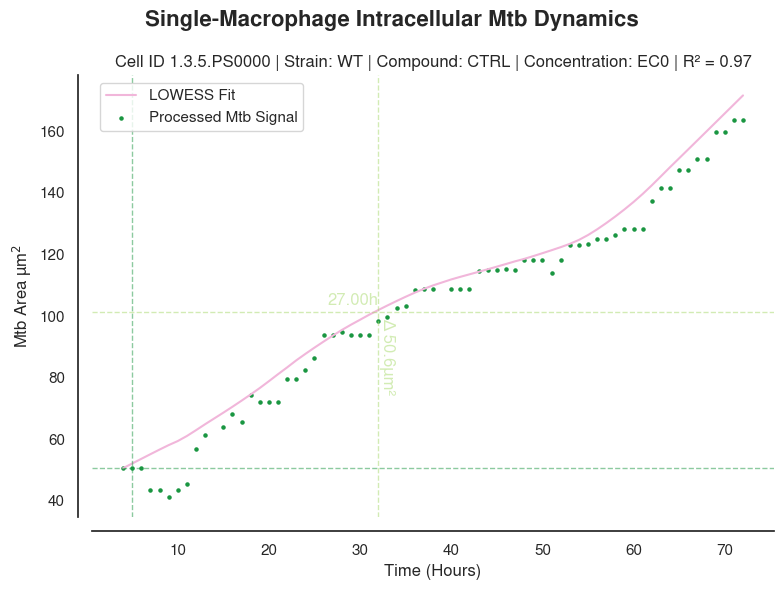

In [28]:
plot.single_cell_growth(df, ID)

# Plot all intracellular single-cell growth dynamics
As a series of colour coded line graphs.

**Note** that the graphs generated with the example data will not look the same as in the publication as the example data only contains one wild-type Mtb untreated condition.

  0%|          | 0/1795 [00:00<?, ?it/s]

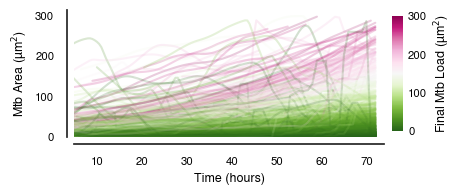

In [147]:
plot.population_dynamics_coloured(df)

# Plot distribution of doubling times
Under different antibiotic conditions and Mtb strains.

**Note** that the graphs generated with the example data will not look the same as in the publication as the example data only contains one wild-type Mtb untreated condition.

/tmp/ipykernel_894048/21637500.py:38: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(


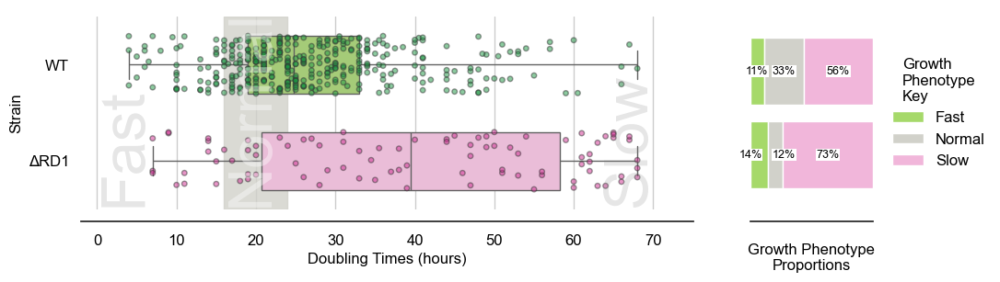

In [100]:
plot.doubling_times_boxplot(df)

### Plot doubling times distributions
According to manual classification of Mtb growth phenotype

**Note** that the graphs generated with the example data will not look the same as in the publication as the example data only contains one wild-type Mtb untreated condition.

/tmp/ipykernel_70986/2761496271.py:30: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(


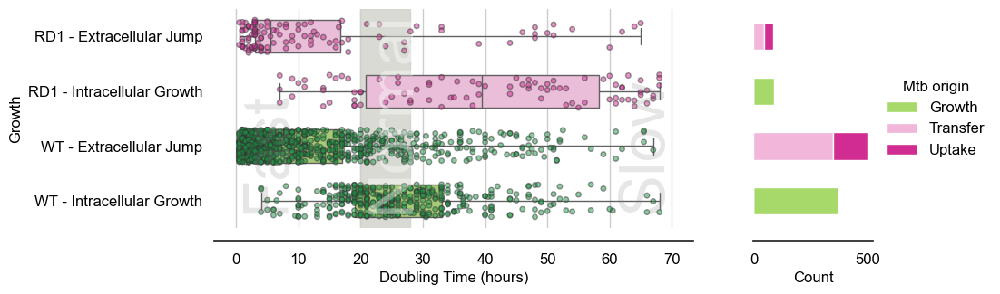

In [48]:
plot.growth_dynamics_by_origin(df)

### Plot doubling times distributions
Across all antibiotic conditions and concentrations 

**Note** that the graphs generated with the example data will not look the same as in the publication as the example data only contains one wild-type Mtb untreated condition.

##### To-do: change to stacked bar charts as in the publication and replot with publication data

/tmp/ipykernel_70986/2962595637.py:38: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(
/tmp/ipykernel_70986/2962595637.py:54: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(
/tmp/ipykernel_70986/2962595637.py:54: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(
/tmp/ipykernel_70986/2962595637.py:54: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(
/tmp/ipykernel_70986/2962595637.py:89: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped

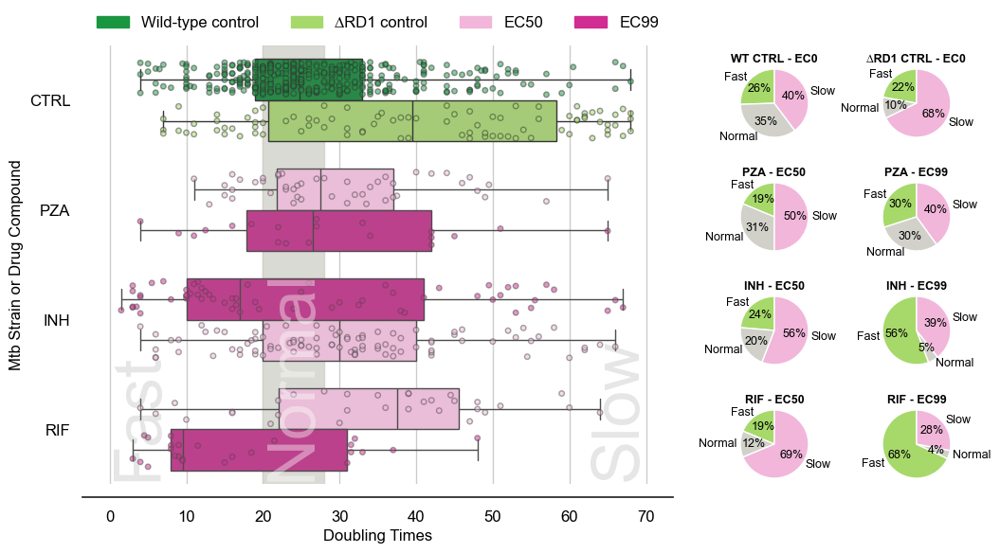

<Figure size 640x480 with 0 Axes>

In [61]:
plot.doubling_times_with_piecharts(df)

# Colour dev

In [4]:
plot.doubling_times_with_piecharts(df)

TypeError: doubling_times_with_piecharts() missing 1 required positional argument: 'expanded_piyg'

In [8]:
# Define the lavender_raisin color map
lavender_raisin = [
    'd8d8f6',   # Light Lavender Raisin
    'b18fcf',   # Medium Lavender Raisin
    '978897',   # Rose Quartz
    '494850',   # Dark Lavender Raisin
    '2c2c34'    # Darkest Lavender Raisin
]

# Define the expanded_piyg color map
expanded_piyg = [
    '#1a9641',  # First color from sns.color_palette('PiYG')
    '#a6d96a',  # Second color from sns.color_palette('PiYG')
    '#978897',  # Rose Quartz in hexadecimal format
    '#d1d1ca',  # Timberwolf in RGB normalized form
    '#f1b6da',  # Second-to-last color from sns.color_palette('PiYG')
    '#d02c91'   # Last color from sns.color_palette('PiYG')
]

# Define the vaporwave color map
vaporwave = [
    '#D02C91',  # Purple Sunset Glow: A rich, warm purple, like the vibrant colors of a sunset.
    '#F1C2F2',  # Blush of the Morning Sky: A soft pastel pink, like the first light of dawn.
    '#C291F2',  # Lavender Breeze: A soothing lavender, like the gentle breeze over a lavender field.
    '#564D8C',  # Midnight Mountain: A deep, cool purple, evoking the silhouette of mountains under the night sky.
    '#57AAF2',  # Ocean's Whisper: A tranquil blue, reflecting the calm of the sea.
    '#A0D9D9',  # Misty Lagoon: A soft, serene blue-green, like mist hovering over a quiet lagoon.
    '#A6D96A',  # Spring Meadow: A vibrant green, capturing the freshness of a meadow in spring.
    '#1A9641'   # Pine Grove Green: A deep, earthy green, reminiscent of a dense pine forest.
]

# Define the mint_taupe color map
mint_taupe = [
    '#0D1321',  # Midnight Horizon: A deep, dark navy, like the sky just before dawn.
    '#1D8FE0',  # Cerulean Splash: A bright, refreshing blue, reminiscent of a clear, sunny day at the ocean.
    '#C5D86D',  # Meadow Mist: A soft, gentle green, like dew on the early morning grass.
    '#ADD9C5',  # Seafoam Whisper: A calming, muted aqua, like the soft lull of ocean waves.
    '#FFEDDF',  # Morning Glow: A light, warm peach, like the first rays of sunlight touching the clouds.
    '#8C6764',  # Rustic Canyon: An earthy, rich brown, reminiscent of the hues of a rugged canyon landscape.
    '#CC5105',  # Autumn Ember: A fiery orange, like the vibrant leaves of fall or the warmth of a glowing hearth.
    '#8D7494'   # Dusky Plum: A muted purple, like the soft twilight just before the night fully sets in.
]

In [19]:
subset

,Time (hours),Mtb Area (µm),dMtb Area (µm),Mphi Area (µm),dMphi Area (µm),Infection Status,Initial Infection Status,Final Infection Status,x,y,...,dMtb Area between frames (µm),Mtb Area Processed (µm),Time Model (hours),Mtb Area Model (µm),mtb_origin,Doubling Amounts,Doubling Times,r2,Frame,category_rank
0,0.0,0.000000,0.0,4649.351562,2080.574775,NaN,0.0,0.0,107.845200,755.241882,...,NaN,NaN,NaN,NaN,None,None,None,1.0,0,NaN
1,0.5,0.000000,0.0,4973.001953,2080.574775,NaN,0.0,0.0,113.264671,764.392212,...,0.0,NaN,NaN,NaN,None,None,None,1.0,1,NaN
2,1.0,0.000000,0.0,4687.857910,2080.574775,NaN,0.0,0.0,116.562256,767.332825,...,0.0,NaN,NaN,NaN,None,None,None,1.0,2,NaN
3,1.5,0.000000,0.0,4209.064453,2080.574775,NaN,0.0,0.0,111.890106,758.421265,...,0.0,NaN,NaN,NaN,None,None,None,1.0,3,NaN
4,2.0,0.000000,0.0,4061.855225,2080.574775,False,0.0,0.0,114.113556,759.828735,...,0.0,NaN,0.0,0.000000,None,None,None,1.0,4,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
604938,74.5,1.318559,0.0,465.719601,-259.532690,1.0,0.0,0.0,199.740707,530.029724,...,NaN,3.754542,70.0,3.831754,NaN,None,None,0.92,149,8.0
604939,75.0,0.000000,0.0,392.506040,-259.532690,0.0,0.0,0.0,200.346191,529.733398,...,NaN,2.771209,70.5,3.993013,NaN,None,None,0.92,150,8.0
604940,75.5,0.000000,0.0,410.295415,-259.532690,0.0,0.0,0.0,200.246902,528.299072,...,NaN,3.285224,71.0,4.152034,NaN,None,None,0.92,151,8.0
604941,76.0,0.000000,0.0,463.708240,-259.532690,0.0,0.0,0.0,200.559875,529.950134,...,NaN,5.251889,71.5,4.311997,NaN,None,None,0.92,152,8.0


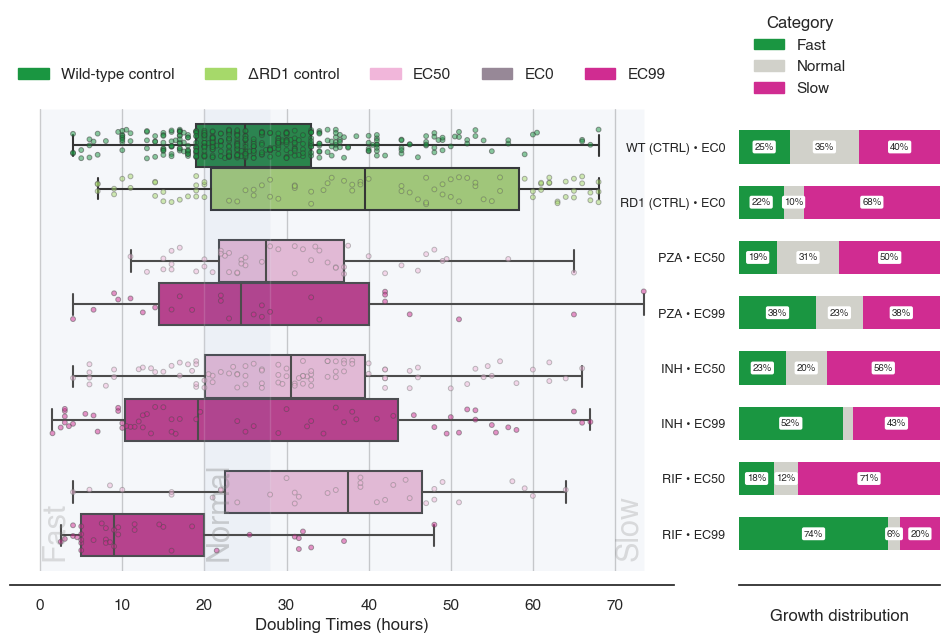

In [58]:
def doubling_times_with_stacked_bars(subset_df, expanded_piyg,
                                     width_in=12, height_in=6, bar_height=0.6):
    """
    Left: box/strip plots of doubling times.
    Right: stacked horizontal bars (Fast/Normal/Slow) for groups that exist only.
    CTRL is coerced to EC0 (no blank EC50/EC99 rows). Rows top→bottom:
    WT (CTRL) → RD1 (CTRL) → PZA → INH → RIF.
    """
    import numpy as np
    import pandas as pd
    import seaborn as sns
    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gridspec
    import matplotlib.patches as mpatches
    import warnings
    warnings.filterwarnings("ignore", message=".*use_inf_as_na option is deprecated.*")
    # Theme
    sns.set_theme(style="white")
    plt.rcParams["font.family"] = "Helvetica"

    df = subset_df.copy()

    # Normalize fields
    for c in ("Compound", "Strain"):
        if c in df:
            df[c] = df[c].astype(str)
    df["Concentration"] = df.get("Concentration", "EC0").fillna("EC0").astype(str)

    # Force CTRL → EC0
    df.loc[df["Compound"].eq("CTRL"), "Concentration"] = "EC0"

    # Scalarize and clean doubling times
    if df["Doubling Times"].apply(lambda v: isinstance(v, (list, tuple, np.ndarray))).any():
        df = df.explode("Doubling Times", ignore_index=True)
    df["Doubling Times"] = pd.to_numeric(df["Doubling Times"], errors="coerce")
    # **Fix the seaborn FutureWarning by removing ±inf before plotting**
    df["Doubling Times"].replace([np.inf, -np.inf], np.nan)
    df = df[df["Doubling Times"].notna() & (df["Doubling Times"] > 0)]

    # De-dupe repeated points
    keys = [k for k in ["ID", "Compound", "Strain", "Concentration", "Doubling Times"] if k in df.columns]
    df = df.drop_duplicates(subset=keys).copy()

    # Derived labels
    bins = [0, 20, 28, np.inf]
    labels = ["Fast", "Normal", "Slow"]
    df["Growth Category"] = pd.cut(df["Doubling Times"], bins=bins, labels=labels, right=False)

    df["Mtb Strain or Drug Compound"] = np.where(df["Compound"].eq("CTRL"), "CTRL", df["Compound"])
    rd1_aliases = {"ΔRD1", "DeltaRD1", "deltaRD1", "RD1del", "RD1"}
    df["Strain_norm"] = np.where(df["Strain"].isin(rd1_aliases), "RD1", "WT")
    df["CTRL Type"] = np.where(df["Compound"].eq("CTRL"), df["Strain_norm"], pd.NA)
    df["Display Compound"] = np.where(df["Compound"].eq("CTRL"),
                                      df["Strain_norm"] + " (CTRL)",
                                      df["Compound"])

    strain_order = ["CTRL", "PZA", "INH", "RIF"]
    right_row_order = ["WT (CTRL)", "RD1 (CTRL)", "PZA", "INH", "RIF"]
    concentration_order = ["EC50", "EC0", "EC99"]
    growth_order = ["Fast", "Normal", "Slow"]

    # Colors
    fast_c, normal_c, slow_c = expanded_piyg[0], expanded_piyg[3], expanded_piyg[5]
    ctrl_wt_c, ctrl_rd1_c = expanded_piyg[0], expanded_piyg[1]
    ec50_c, ec0_c, ec99_c = expanded_piyg[4], expanded_piyg[2], expanded_piyg[5]

    # Figure
    fig = plt.figure(figsize=(width_in, height_in))
    gs = gridspec.GridSpec(1, 2, width_ratios=[3.3, 1], wspace=0.15)
    ax = plt.subplot(gs[0])
    ax_bar = plt.subplot(gs[1])

    # Left panel: CTRL
    ctrl_df = df[df["Mtb Strain or Drug Compound"] == "CTRL"]
    if not ctrl_df.empty:
        sns.boxplot(data=ctrl_df, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="CTRL Type",
                    whis=[0, 100], width=.75, palette=[ctrl_wt_c, ctrl_rd1_c],
                    ax=ax, order=strain_order)
        sns.stripplot(data=ctrl_df, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="CTRL Type",
                      size=3.5, linewidth=0.7, edgecolor="gray", jitter=0.25, dodge=True, alpha=0.5,
                      palette=[ctrl_wt_c, ctrl_rd1_c], ax=ax, order=strain_order)
        if ax.legend_:
            ax.legend_.remove()

    # Left panel: drugs
    drug_df = df[df["Mtb Strain or Drug Compound"] != "CTRL"]
    for compound in ["PZA", "INH", "RIF"]:
        sub = drug_df[drug_df["Mtb Strain or Drug Compound"] == compound]
        if sub.empty:
            continue
        present = [c for c in concentration_order if c in sub["Concentration"].unique()]
        pal = [ec50_c if c == "EC50" else ec99_c if c == "EC99" else ec0_c for c in present]
        sns.boxplot(data=sub, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration",
                    whis=[0, 100], width=.75, palette=pal, hue_order=present, ax=ax, order=strain_order)
        sns.stripplot(data=sub, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration",
                      size=3.5, linewidth=0.7, edgecolor="gray", jitter=0.25, dodge=True, alpha=0.5,
                      palette=pal, hue_order=present, ax=ax, order=strain_order)
        if ax.legend_:
            ax.legend_.remove()

    # Bands + labels
    xmax = float(df["Doubling Times"].max())
    ax.axvspan(0, 20, alpha=0.05)
    ax.axvspan(20, 28, alpha=0.10)
    ax.axvspan(28, xmax, alpha=0.05)
    ymax = len(strain_order) - 0.65
    ax.text(0,  ymax, "Fast",   fontsize=22, color="gray", alpha=0.25, ha="left",  rotation=90)
    ax.text(20, ymax, "Normal", fontsize=22, color="gray", alpha=0.35, ha="left",  rotation=90)
    ax.text(xmax, ymax, "Slow",  fontsize=22, color="gray", alpha=0.25, ha="right", rotation=90)

    ax.set_xlabel("Doubling Times (hours)")
    ax.set_ylabel("")
    ax.set_yticks([])

    ax.xaxis.grid(True)
    sns.despine(offset=10, left=True, ax=ax)

    # **Matplotlib ≥3.9 requires keyword `handles=` to avoid the TypeError**
    legend_handles = [
        mpatches.Patch(color=ctrl_wt_c, label="Wild-type control"),
        mpatches.Patch(color=ctrl_rd1_c, label="ΔRD1 control"),
        mpatches.Patch(color=ec50_c, label="EC50"),
        mpatches.Patch(color=ec0_c,  label="EC0"),
        mpatches.Patch(color=ec99_c, label="EC99"),
    ]
    ax.legend(handles=legend_handles, loc="upper center",
              bbox_to_anchor=(0.5, 1.12), ncol=5, frameon=False)

    # Right panel: only existing groups, ordered top→bottom
    g = (df.groupby(["Display Compound", "Concentration", "Growth Category"], observed=True)
           .size()
           .unstack("Growth Category", fill_value=0))

    rows = [(comp, conc)
            for comp in right_row_order
            for conc in concentration_order
            if (comp, conc) in g.index and g.loc[(comp, conc)].sum() > 0]

    if rows:
        g = g.loc[pd.MultiIndex.from_tuples(rows, names=["Display Compound", "Concentration"])]
        totals = g.sum(axis=1).replace(0, np.nan)
        props = (g.T / totals).T.fillna(0.0)

        y_pos = np.arange(len(props))
        y_labels = [f"{comp} • {conc}" for comp, conc in props.index]
        growth_colors = {"Fast": fast_c, "Normal": normal_c, "Slow": slow_c}

        lefts = np.zeros(len(props))
        for gr in growth_order:  # Fast→Normal→Slow left→right
            vals = props[gr].values
            bars = ax_bar.barh(
                y=y_pos, width=vals, left=lefts, height=bar_height,
                label=gr, color=growth_colors[gr], edgecolor="none"
            )

            # --- Add percentage labels ---
            for bar, v in zip(bars, vals):
                if v > 0.05:  # only label if >=5% to avoid clutter
                    x_center = bar.get_x() + bar.get_width() / 2
                    y_center = bar.get_y() + bar.get_height() / 2
                    ax_bar.text(
                        x_center, y_center,
                        f"{v*100:.0f}%", ha="center", va="center",
                        fontsize=7, fontweight="bold",
                        bbox=dict(facecolor="white", edgecolor="none", boxstyle="round,pad=0.2")
                    )

            lefts += vals

        ax_bar.set_xlim(0, 1)
        ax_bar.set_xticks([])
        ax_bar.set_xticklabels("")
        ax_bar.set_yticks(y_pos)
        ax_bar.set_yticklabels(y_labels, fontsize=9)
        ax_bar.set_xlabel("\nGrowth distribution")
        ax_bar.set_ylabel("")
        ax_bar.invert_yaxis()
        sns.despine(offset=10, left=True, ax=ax_bar)

        handles = [mpatches.Patch(color=growth_colors[k], label=k) for k in growth_order]
        ax_bar.legend(handles=handles, title="Category", loc="lower right", frameon=False, bbox_to_anchor=(0.6,1.0))
    else:
        ax_bar.axis("off")

    plt.tight_layout()
    plt.show()

subset_df = df[df['mtb_origin']=='Growth'].copy()
doubling_times_with_stacked_bars(subset_df, expanded_piyg)

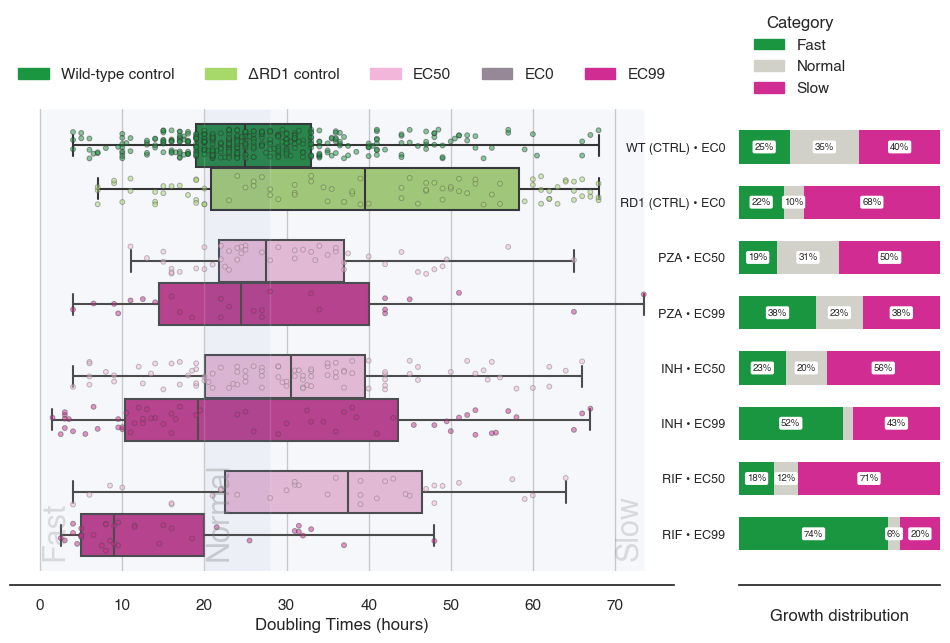

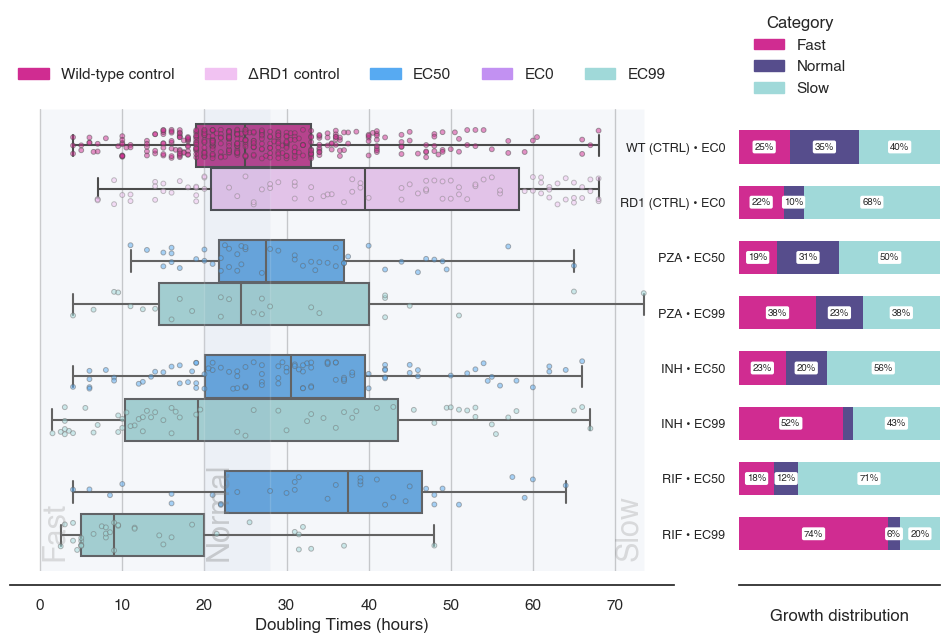

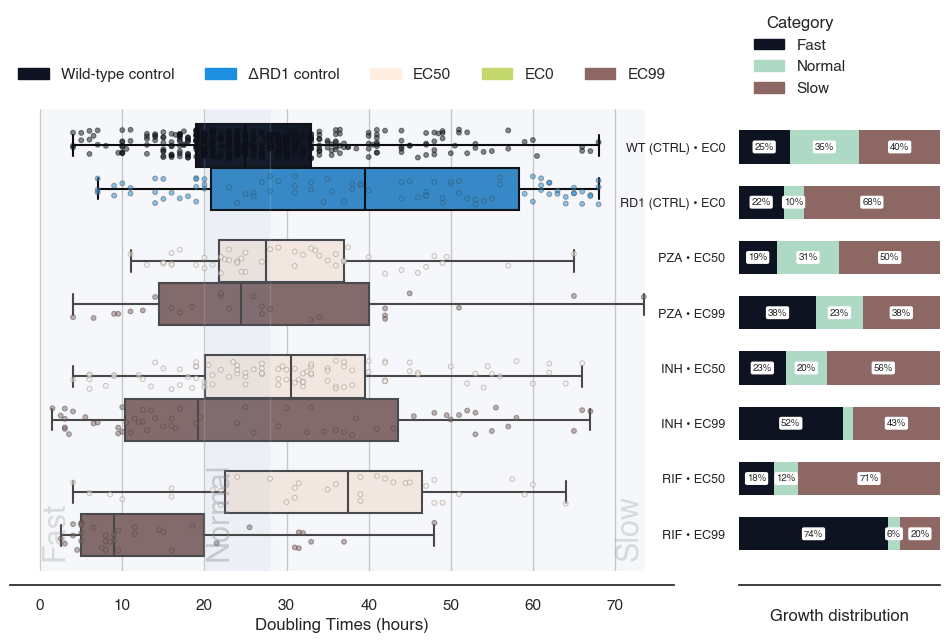

In [60]:
cmaps = [expanded_piyg, vaporwave, mint_taupe]
for cmap in cmaps:
    doubling_times_with_stacked_bars(subset_df, cmap)

In [173]:
# --- Color sampling helper (drop in near your imports) ---
def _sample_colors(cmap_spec, n):
    """
    Return n colors sampled evenly across a colormap or a list of hex codes.
    - cmap_spec: str (matplotlib/seaborn cmap name) OR list of hex codes.
    - returns list of hex strings length n.
    """
    import numpy as np
    from matplotlib import cm
    from matplotlib.colors import ListedColormap, to_hex

    if isinstance(cmap_spec, list):
        if len(cmap_spec) == n:
            return [to_hex(c) if not isinstance(c, str) else c for c in cmap_spec]
        # interpolate across the provided list
        cmap = ListedColormap(cmap_spec)
        return [to_hex(cmap(x)) for x in np.linspace(0, 1, n)]
    else:
        cmap = cm.get_cmap(cmap_spec)
        return [to_hex(cmap(x)) for x in np.linspace(0, 1, n)]

In [186]:
# --- Helper: grouped Y positions with tight pairs but full-axis height ---
def _grouped_y_positions(index, inner_gap=0.6, outer_gap=1.2, group_key=None):
    """
    Build y positions for barh so rows within the same *group* are close,
    and gaps between groups are larger — while keeping the TOTAL axis height unchanged.

    Parameters
    ----------
    index : iterable of (compound_label, concentration_label)
        Usually props.index from your right-panel table.
    inner_gap : float
        Spacing inside a group (e.g., EC50 vs EC99, or WT vs RD1).
    outer_gap : float
        Spacing between different groups (e.g., CTRL block vs PZA).
    group_key : callable | None
        Function mapping `compound_label` -> group id.
        If None, controls are grouped together automatically:
          'WT (CTRL)' and 'RD1 (CTRL)' -> 'CTRL'; others -> themselves.
    """
    import numpy as np

    def _default_group_key(comp):
        # Group any control labels together
        return "CTRL" if isinstance(comp, str) and "(CTRL" in comp else comp

    gkey = group_key or _default_group_key

    positions = []
    cur = 0.0
    prev_group = None

    for comp, _conc in index:
        grp = gkey(comp)
        if prev_group is None:
            positions.append(cur)
        elif grp == prev_group:
            cur += inner_gap       # small gap within the same group
            positions.append(cur)
        else:
            cur += outer_gap       # bigger gap to a new group
            positions.append(cur)
        prev_group = grp

    # Rescale to 0..(n-1) so bars still span full axis height
    n = len(positions)
    if n <= 1:
        return np.array([0.0]) if n == 1 else np.array([])
    scale = (n - 1) / positions[-1]
    return np.array(positions) * scale

In [205]:
comp = "WT (CTRL)"

In [208]:
comp.split('(')

['WT ', 'CTRL)']

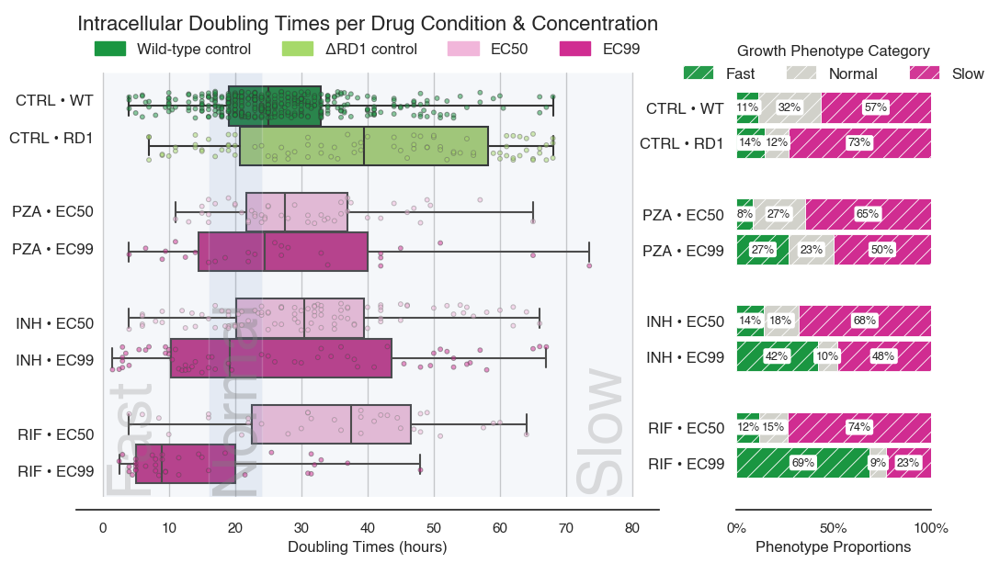

In [216]:
def doubling_times_with_stacked_bars(
    subset_df,
    box_cmap="expanded_piyg",   # left panel palette/colormap
    bar_cmap="viridis",         # right panel palette/colormap
    width_in=12,
    height_in=6,
    bar_height=0.6,
    use_hatches=True,
    hatch_patterns=("///", "xxx", "---"),
    hatch_edgecolor="black",
    hatch_linewidth=0.6
):
    """
    Left: box/strip plots of doubling times (box_cmap).
    Right: stacked horizontal bars (Fast/Normal/Slow) with independent palette/colormap (bar_cmap).

    box_cmap / bar_cmap can be:
      • str  → matplotlib/seaborn colormap name
      • list → explicit list of hex codes (custom palette like expanded_piyg)

    CTRL coerced to EC0 (no blank EC50/EC99 rows).
    Rows top→bottom: WT (CTRL) → RD1 (CTRL) → PZA → INH → RIF.
    """
    import math
    import numpy as np
    import pandas as pd
    import seaborn as sns
    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gridspec
    import matplotlib.patches as mpatches
    import matplotlib.cm as cm
    from matplotlib.colors import to_rgba, ListedColormap
    from matplotlib import font_manager as fm


    # Theme
    sns.set_theme(style="white")
    plt.rcParams["font.family"] = "Helvetica"
    plt.rcParams["hatch.linewidth"] = hatch_linewidth

    df = subset_df.copy()
    for c in ("Compound", "Strain"):
        if c in df:
            df[c] = df[c].astype(str)
    df["Concentration"] = df.get("Concentration", "EC0").fillna("EC0").astype(str)
    df.loc[df["Compound"].eq("CTRL"), "Concentration"] = "EC0"

    # Scalarize doubling times
    if df["Doubling Times"].apply(lambda v: isinstance(v, (list, tuple, np.ndarray))).any():
        df = df.explode("Doubling Times", ignore_index=True)
    df["Doubling Times"] = pd.to_numeric(df["Doubling Times"], errors="coerce")
    df["Doubling Times"] = df["Doubling Times"].replace([np.inf, -np.inf], np.nan)
    df = df[df["Doubling Times"].notna() & (df["Doubling Times"] > 0)]

    keys = [k for k in ["ID", "Compound", "Strain", "Concentration", "Doubling Times"] if k in df.columns]
    df = df.drop_duplicates(subset=keys).copy()

    # Growth categories
    bins = [0, 16, 24, np.inf]
    labels = ["Fast", "Normal", "Slow"]
    df["Growth Category"] = pd.cut(df["Doubling Times"], bins=bins, labels=labels, right=False)

    df["Mtb Strain or Drug Compound"] = np.where(df["Compound"].eq("CTRL"), "CTRL", df["Compound"])
    rd1_aliases = {"ΔRD1", "DeltaRD1", "deltaRD1", "RD1del", "RD1"}
    df["Strain_norm"] = np.where(df["Strain"].isin(rd1_aliases), "RD1", "WT")
    df["CTRL Type"] = np.where(df["Compound"].eq("CTRL"), df["Strain_norm"], pd.NA)
    df["Display Compound"] = np.where(df["Compound"].eq("CTRL"),
                                      df["Strain_norm"] + " (CTRL)",
                                      df["Compound"])

    strain_order = ["CTRL", "PZA", "INH", "RIF"]
    right_row_order = ["WT (CTRL)", "RD1 (CTRL)", "PZA", "INH", "RIF"]
    concentration_order = ["EC50", "EC0", "EC99"]
    growth_order = ["Fast", "Normal", "Slow"]

    # --- Colors ---
    # Left panel palette
    if isinstance(box_cmap, list):
        palette = box_cmap
    else:
        palette = sns.color_palette(box_cmap, 4)

    # We need exactly 4 colors: WT control, ΔRD1 control, EC50, EC99
    palette4 = _sample_colors(box_cmap, 4)
    ctrl_wt_c, ctrl_rd1_c, ec50_c, ec99_c = palette4  
    
    # Right panel palette
    if isinstance(bar_cmap, list):
        # Build a ListedColormap from the provided hex codes
        cmap = ListedColormap(bar_cmap)
    
        # Sample evenly spaced positions across the full range [0,1]
        positions = np.linspace(0, 1, len(growth_order))
        growth_colors = {gr: to_rgba(cmap(pos)) for gr, pos in zip(growth_order, positions)}

    else:
        cmap = cm.get_cmap(bar_cmap, len(growth_order))
        growth_colors = {gr: to_rgba(cmap(i)) for i, gr in enumerate(growth_order)}

    # Optional alpha adjust for hatches
    for k in growth_colors:
        r, g, b, a = growth_colors[k]
        growth_colors[k] = (r, g, b, 0.95)

    # Hatch pattern mapping
    hatch_map = dict(zip(growth_order, hatch_patterns)) if use_hatches else {gr: None for gr in growth_order}

    # --- Figure ---
    fig = plt.figure(figsize=(width_in, height_in))
    gs = gridspec.GridSpec(1, 2, width_ratios=[3, 1], wspace=0.2)
    ax = plt.subplot(gs[0])
    ax_bar = plt.subplot(gs[1])

    xmax = math.ceil(float(df["Doubling Times"].max()) / 10) * 10
    ax.axvspan(0, bins[1], alpha=0.05)
    ax.axvspan(bins[1], bins[2], alpha=0.15)
    ax.axvspan(bins[2], xmax, alpha=0.05)
    ymax = len(strain_order) - 0.65
    ax.text(bins[0],  ymax, "Fast",   fontsize=48, color="gray", alpha=0.25, ha="left",  rotation=90)
    ax.text(bins[1], ymax, "Normal", fontsize=48, color="gray", alpha=0.35, ha="left",  rotation=90)
    ax.text(xmax, ymax, "Slow",  fontsize=48, color="gray", alpha=0.25, ha="right", rotation=90)

    # --- Left panel: CTRL
    ctrl_df = df[df["Mtb Strain or Drug Compound"] == "CTRL"]
    if not ctrl_df.empty:
        sns.boxplot(data=ctrl_df, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="CTRL Type",
                    whis=[0, 100], width=.75, palette=[ctrl_wt_c, ctrl_rd1_c],
                    ax=ax, order=strain_order)
        sns.stripplot(data=ctrl_df, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="CTRL Type",
                      size=3.5, linewidth=0.7, edgecolor="gray", jitter=0.25, dodge=True, alpha=0.5,
                      palette=[ctrl_wt_c, ctrl_rd1_c], ax=ax, order=strain_order)
        if ax.legend_: ax.legend_.remove()

    # --- Left panel: drugs
    drug_df = df[df["Mtb Strain or Drug Compound"] != "CTRL"]
    for compound in ["PZA", "INH", "RIF"]:
        sub = drug_df[drug_df["Mtb Strain or Drug Compound"] == compound]
        if sub.empty: continue
        present = [c for c in concentration_order if c in sub["Concentration"].unique()]
        pal = [ec50_c if c == "EC50" else ec99_c if c == "EC99" else ec0_c for c in present]
        sns.boxplot(data=sub, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration",
                    whis=[0, 100], width=.75, palette=pal, hue_order=present, ax=ax, order=strain_order)
        sns.stripplot(data=sub, x="Doubling Times", y="Mtb Strain or Drug Compound", hue="Concentration",
                      size=3.5, linewidth=0.7, edgecolor="gray", jitter=0.25, dodge=True, alpha=0.5,
                      palette=pal, hue_order=present, ax=ax, order=strain_order)
        if ax.legend_: ax.legend_.remove()

    ax.set_xlabel("Doubling Times (hours)")
    ax.set_ylabel("")
    # ax.set_yticks(np.arange(len(strain_order)))
    # ax.set_yticklabels(strain_order)
    ax.tick_params(axis="y", which="major", pad=-20)

    ax.xaxis.grid(True)
    sns.despine(offset=10, left=True, ax=ax)

    legend_handles = [
        mpatches.Patch(color=ctrl_wt_c, label="Wild-type control"),
        mpatches.Patch(color=ctrl_rd1_c, label="ΔRD1 control"),
        mpatches.Patch(color=ec50_c, label="EC50"),
        mpatches.Patch(color=ec99_c, label="EC99"),
    ]
    ax.legend(handles=legend_handles, loc="upper center",
              bbox_to_anchor=(0.5, 1.17), ncol=len(legend_handles), frameon=False,
              handlelength=2, handleheight=1.0, fontsize=12,
              title="Intracellular Doubling Times per Drug Condition & Concentration",
              title_fontproperties=fm.FontProperties(weight="bold", size=16))

    # --- Right panel stacked bars
    g = (df.groupby(["Display Compound", "Concentration", "Growth Category"], observed=True)
           .size()
           .unstack("Growth Category", fill_value=0)
           .reindex(columns=growth_order, fill_value=0))

    rows = [(comp, conc)
            for comp in right_row_order
            for conc in concentration_order
            if (comp, conc) in g.index and g.loc[(comp, conc)].sum() > 0]

    if rows:
        g = g.loc[pd.MultiIndex.from_tuples(rows, names=["Display Compound", "Concentration"])]
        totals = g.sum(axis=1).replace(0, np.nan)
        props = (g.T / totals).T.fillna(0.0)

        y_pos = _grouped_y_positions(props.index, inner_gap=0.5, outer_gap=1.)

        lefts = np.zeros(len(props))
        for gr in growth_order:
            vals = props[gr].values
            bars = ax_bar.barh(
                y=y_pos, width=vals, left=lefts, height=bar_height,
                label=gr, color=growth_colors[gr],
                edgecolor=hatch_edgecolor if use_hatches else "none",
                hatch=hatch_map[gr] if use_hatches else None,
                linewidth=hatch_linewidth if use_hatches else 0.0
            )
            lefts += vals
        
        y_labels = [
            f"{comp} • {conc}" if conc != "EC0"
            else ("CTRL • WT" if comp.startswith("WT") else
                  "CTRL • RD1" if comp.startswith("RD1") else comp)
            for comp, conc in props.index
        ]      
        lefts = np.zeros(len(props))
        for gr in growth_order:
            vals = props[gr].values
            bars = ax_bar.barh(
                y=y_pos, width=vals, left=lefts, height=bar_height,
                label=gr, color=growth_colors[gr],
                edgecolor=hatch_edgecolor if use_hatches else "none",
                hatch=hatch_map[gr] if use_hatches else None,
                linewidth=hatch_linewidth if use_hatches else 0.0
            )
            for bar, v in zip(bars, vals):
                if v > 0.05:
                    x_center = bar.get_x() + bar.get_width() / 2
                    y_center = bar.get_y() + bar.get_height() / 2
                    ax_bar.text(
                        x_center, y_center, f"{v*100:.0f}%",
                        ha="center", va="center", fontsize=9, fontweight="bold",
                        bbox=dict(facecolor="white", edgecolor="none", boxstyle="round,pad=0.2"),
                        zorder=5
                    )
            lefts += vals

        ax_bar.set_xlim(0, 1)
        ax_bar.set_xticks([0,0.5,1])
        ax_bar.set_xticklabels(["0%", "50%","100%"])
        ax_bar.set_yticks(y_pos)
        ax_bar.set_yticklabels(y_labels, fontsize=12, fontweight='bold')
        ax_bar.set_xlabel("Phenotype Proportions")
        ax_bar.set_ylabel("")
        ax_bar.invert_yaxis()
        sns.despine(offset=10, left=True, ax=ax_bar)
        
        handles = [
            mpatches.Patch(
                facecolor=growth_colors[k],
                edgecolor=hatch_edgecolor if use_hatches else "none",
                hatch=hatch_map[k] if use_hatches else None,
                label=k,
                linewidth=hatch_linewidth if use_hatches else 0.0
            )
            for k in growth_order
        ]
        ax_bar.legend(handles=handles, frameon=False, loc="upper center",
                      bbox_to_anchor=(0.5, 1.1), ncol=len(handles),
                      handlelength=2, handleheight=1.0, fontsize=12,
                      title="Growth Phenotype Category", 
                      title_fontproperties=fm.FontProperties(weight="bold", size=12))
    else:
        ax_bar.axis("off")

    ax.set_yticks(y_pos/2 - 0.25)
    ax.set_yticklabels(y_labels, fontsize=12, fontweight='bold')
    
    plt.tight_layout()
    plt.show()
    
doubling_times_with_stacked_bars(
        subset_df,
        box_cmap=['#1a9641', '#a6d96a', '#d1d1ca', '#f1b6da', '#d02c91'],
        bar_cmap=expanded_piyg,
        hatch_patterns=("//", "//", "//"),
        hatch_edgecolor="white",
        hatch_linewidth=0.6
    )

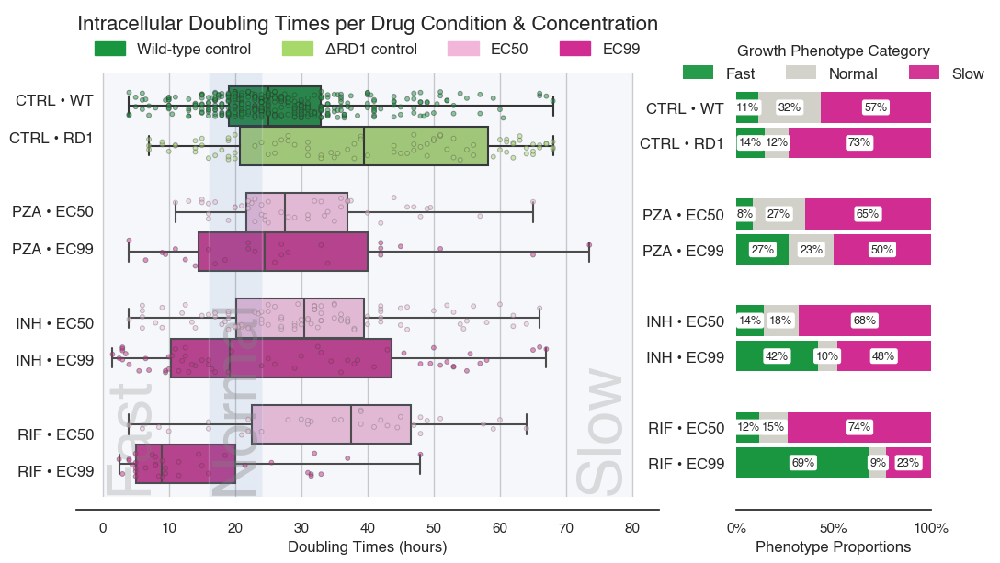

In [217]:
doubling_times_with_stacked_bars(
        subset_df,
        box_cmap=['#1a9641', '#a6d96a', '#d1d1ca', '#f1b6da', '#d02c91'],
        bar_cmap=expanded_piyg,
        use_hatches=False
    )

Plotting with cmap=mako, hatches=('//', '---', '\\')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


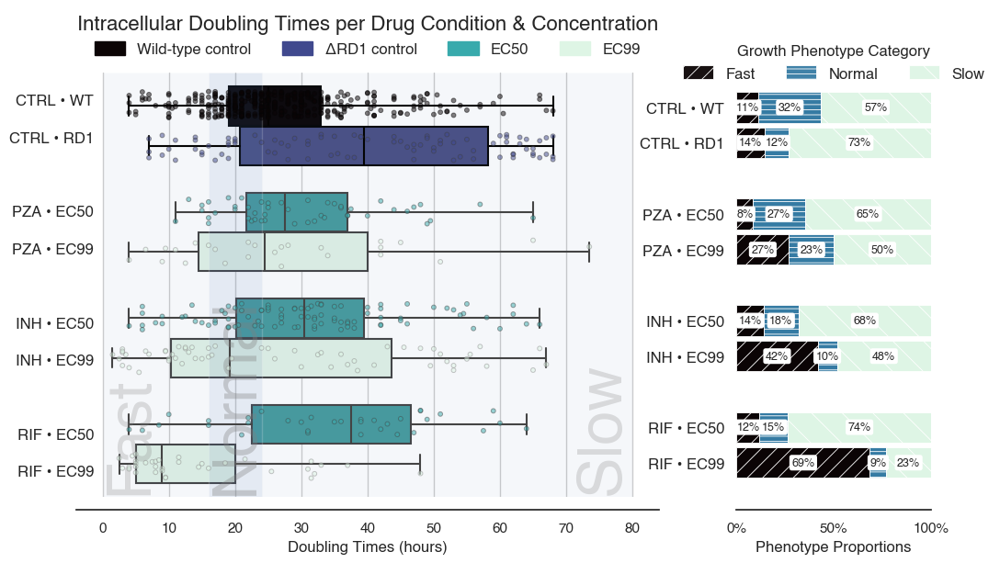

Plotting with cmap=inferno, hatches=('//', '---', '\\')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


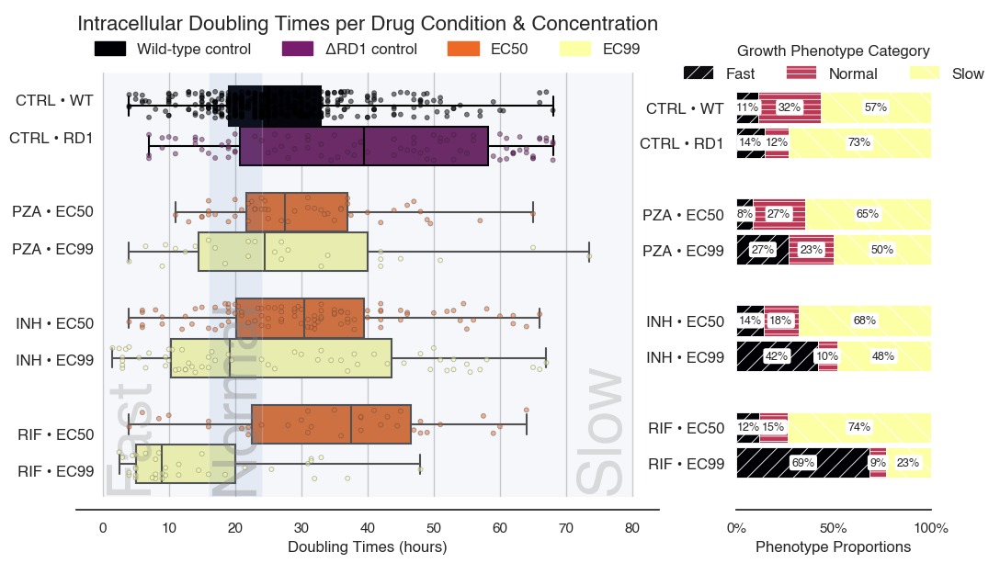

Plotting with cmap=plasma, hatches=('//', '---', '\\')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


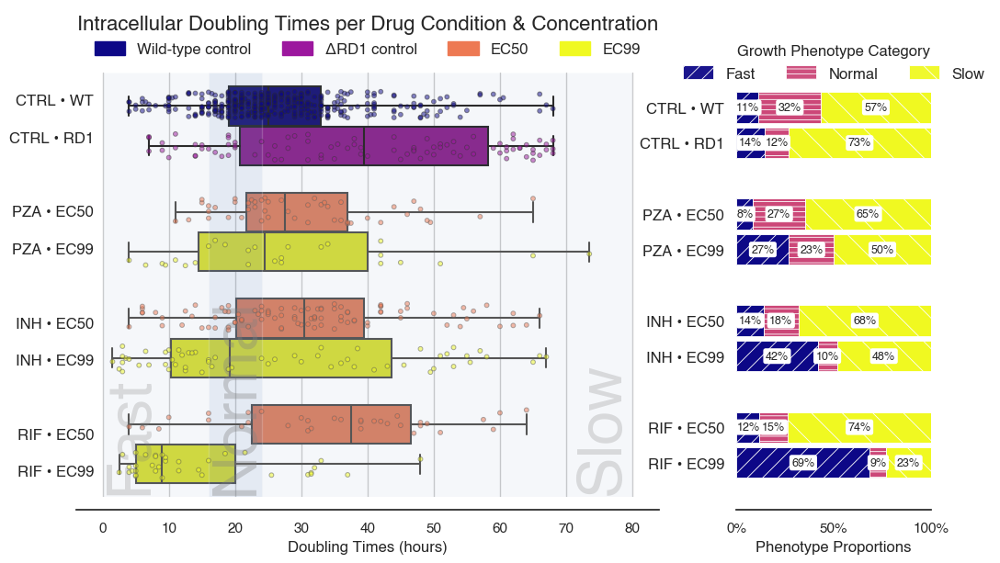

Plotting with cmap=cividis, hatches=('//', '---', '\\')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


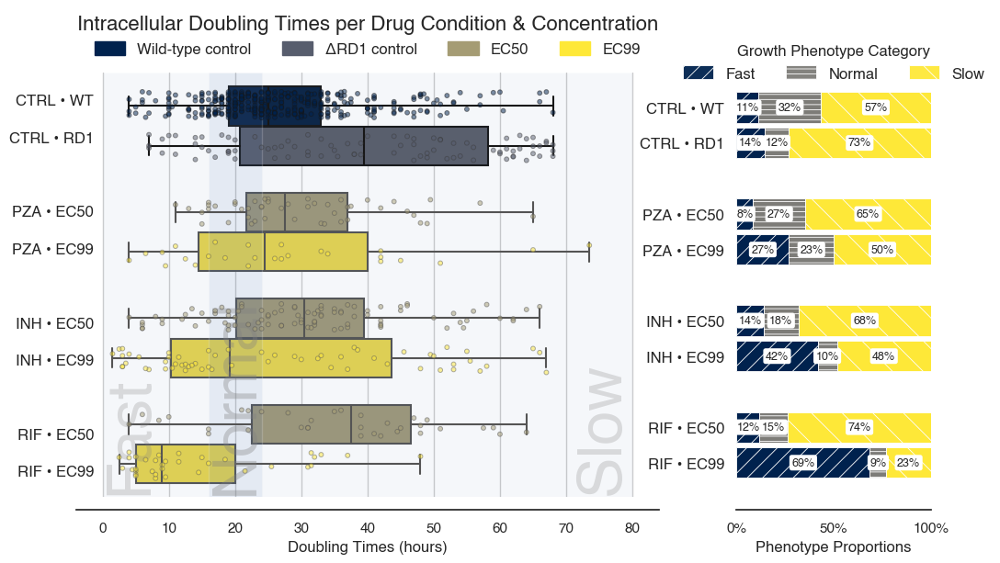

Plotting with cmap=coolwarm, hatches=('//', '---', '\\')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


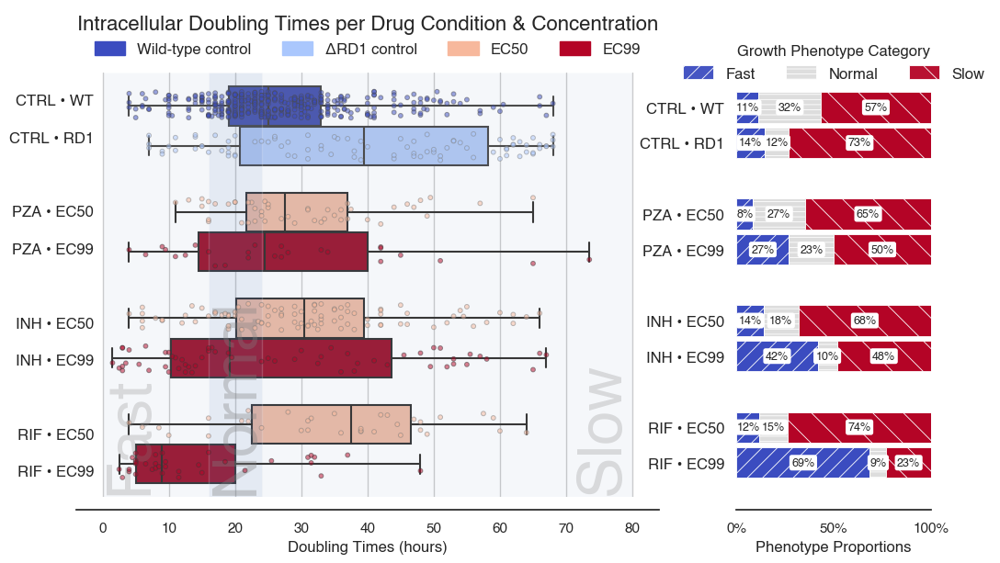

Plotting with cmap=viridis, hatches=('//', '---', '\\')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


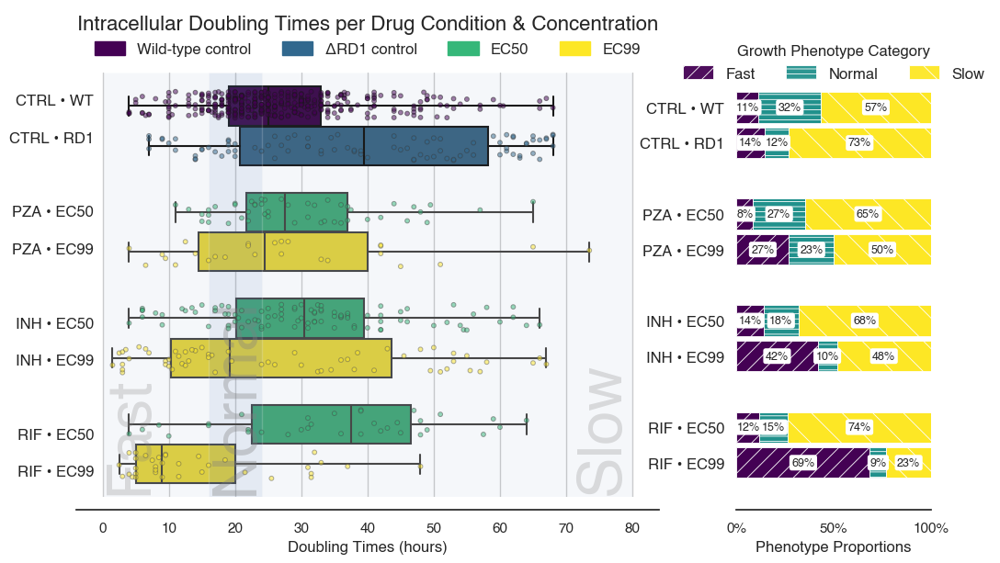

Plotting with cmap=PiYG_r, hatches=('//', '---', '\\')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


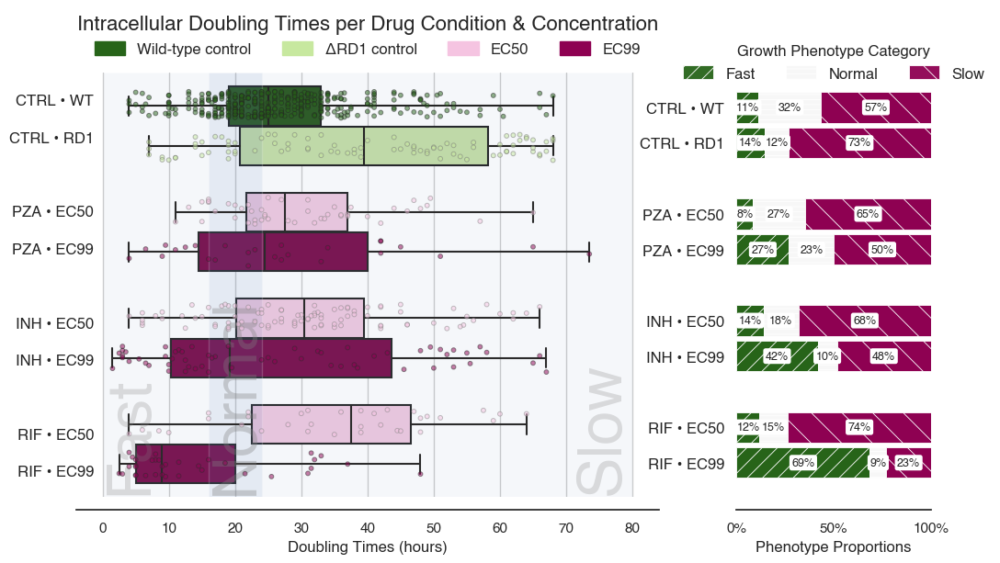

Plotting with cmap=rocket, hatches=('//', '---', '\\')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


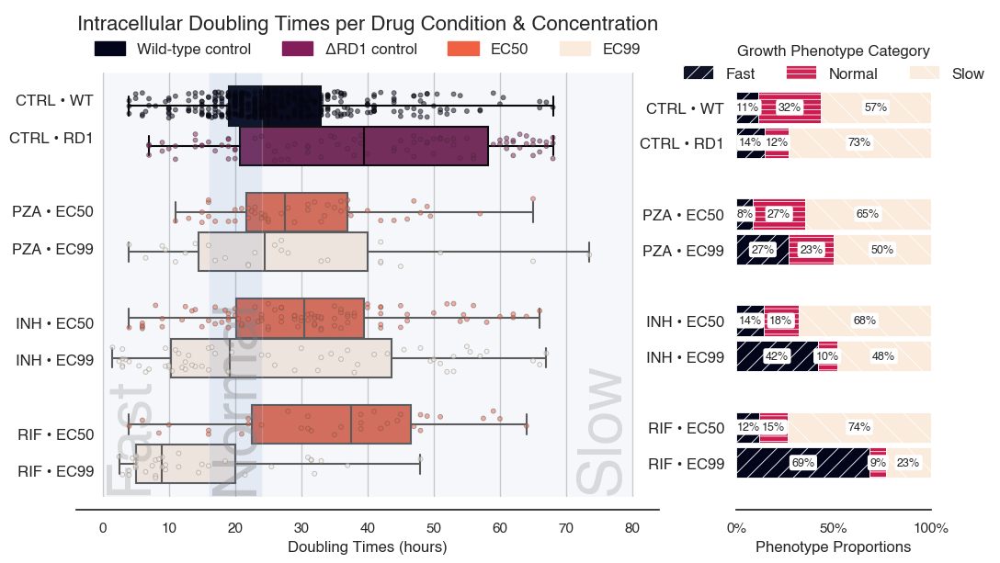

Plotting with cmap=flare, hatches=('//', '---', '\\')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


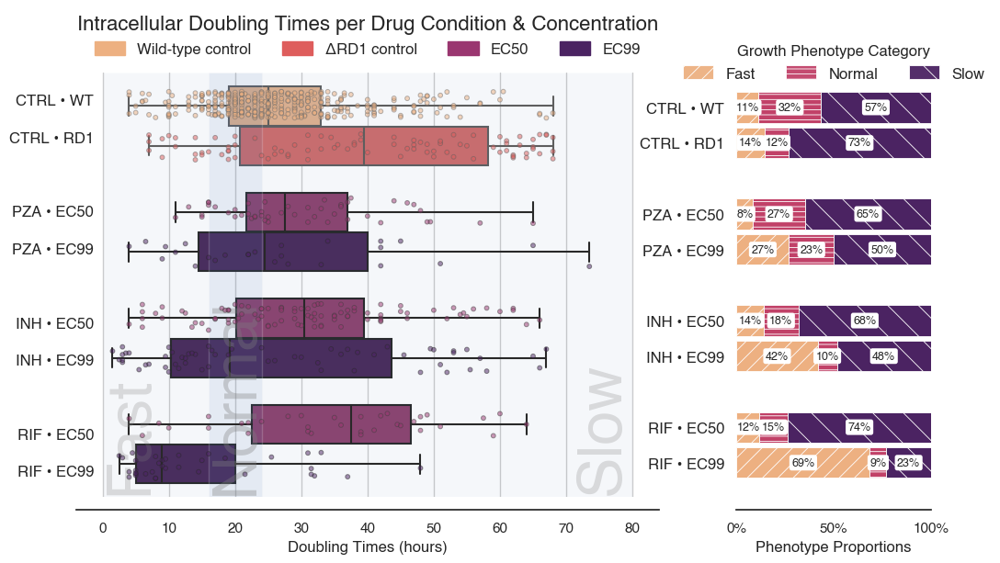

Plotting with cmap=crest, hatches=('//', '---', '\\')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


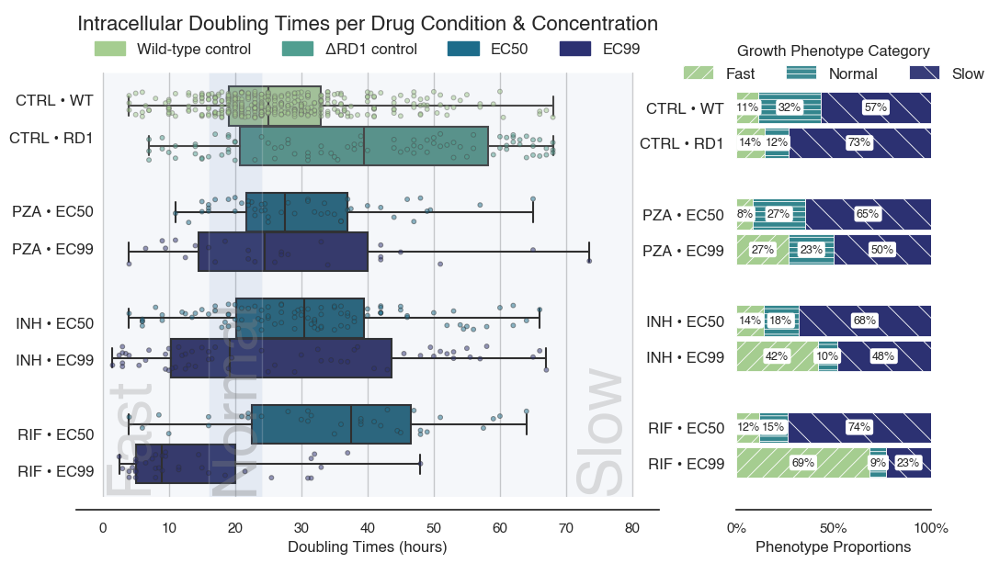

Plotting with cmap=Spectral, hatches=('//', '---', '\\')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


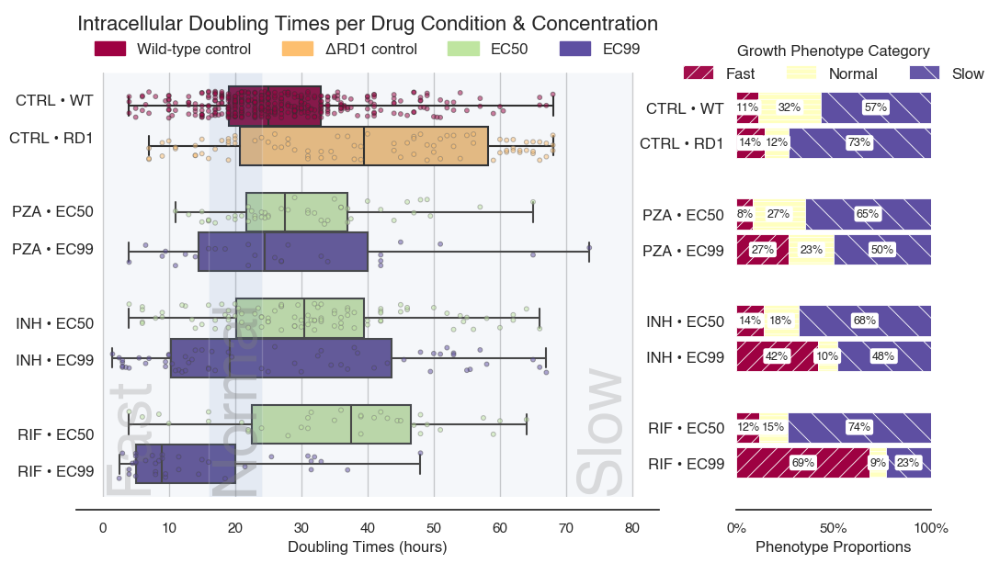

Plotting with cmap=RdYlGn, hatches=('//', '---', '\\')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


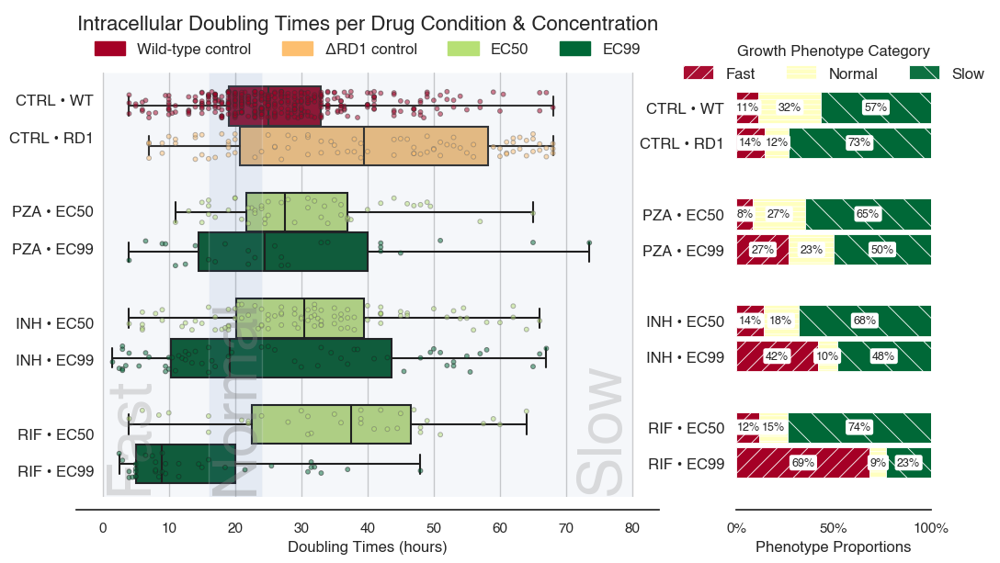

Plotting with cmap=YlOrBr, hatches=('//', '---', '\\')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


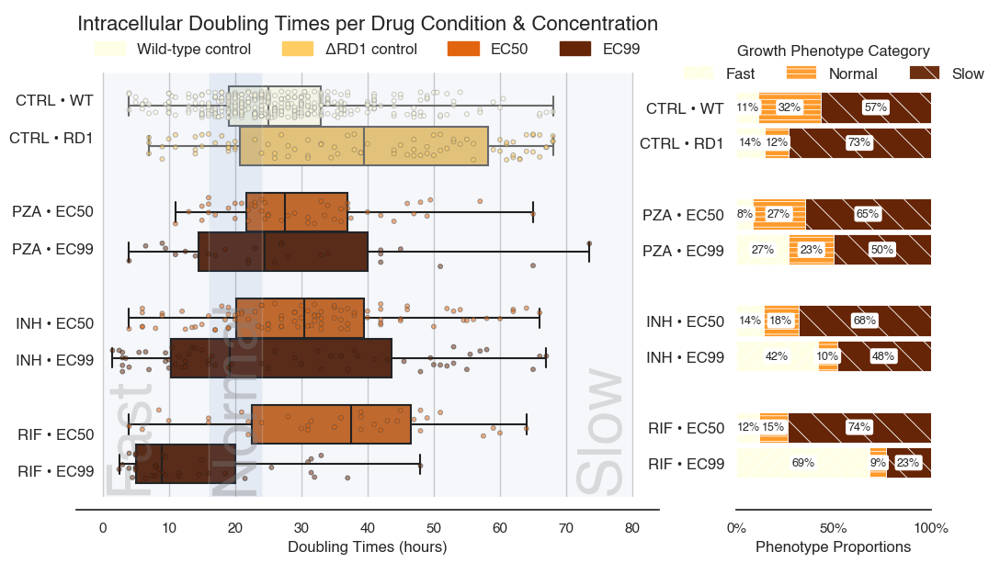

Plotting with cmap=cubehelix, hatches=('//', '---', '\\')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


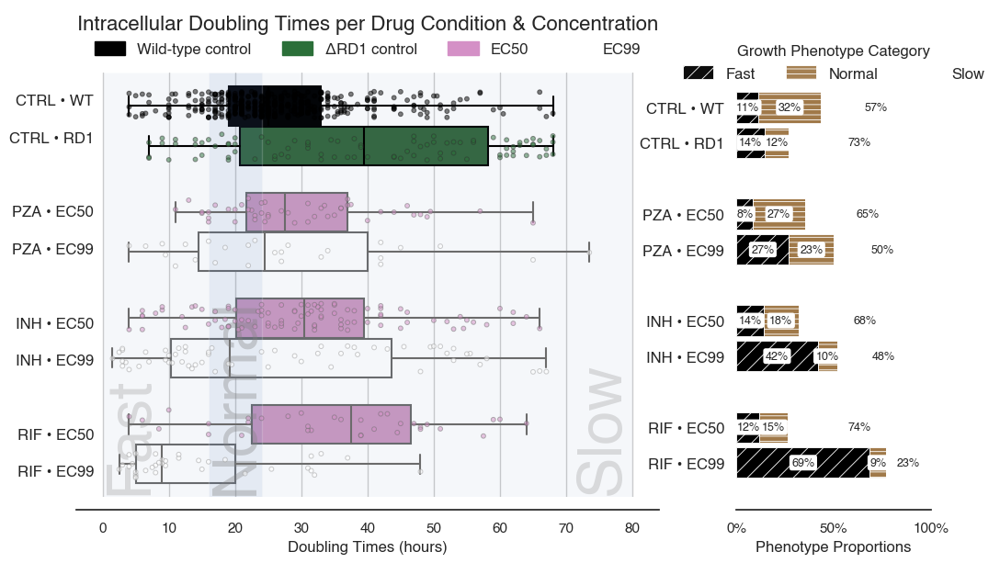

Plotting with cmap=mako, hatches=('xxx', '-', 'xxx')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


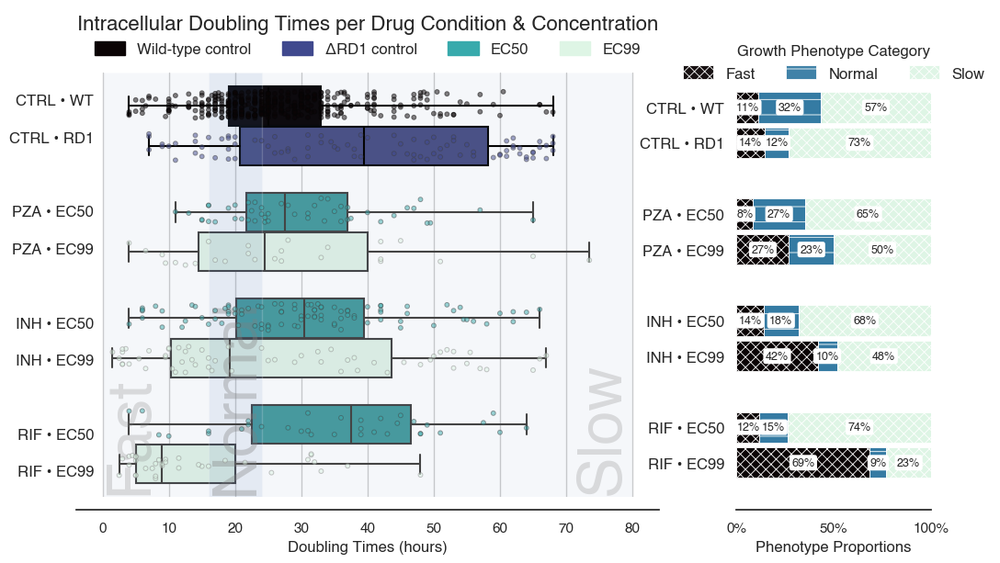

Plotting with cmap=inferno, hatches=('xxx', '-', 'xxx')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


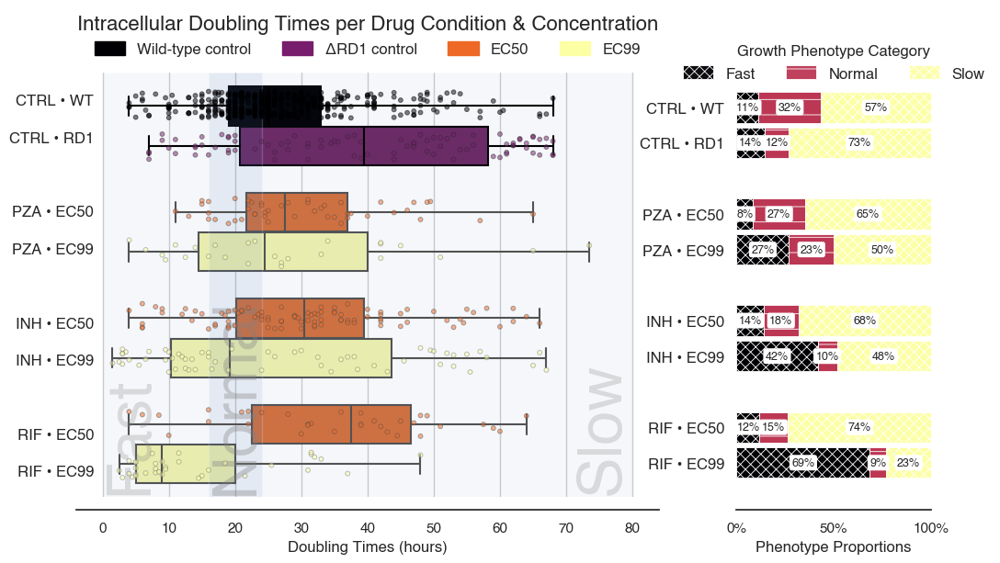

Plotting with cmap=plasma, hatches=('xxx', '-', 'xxx')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


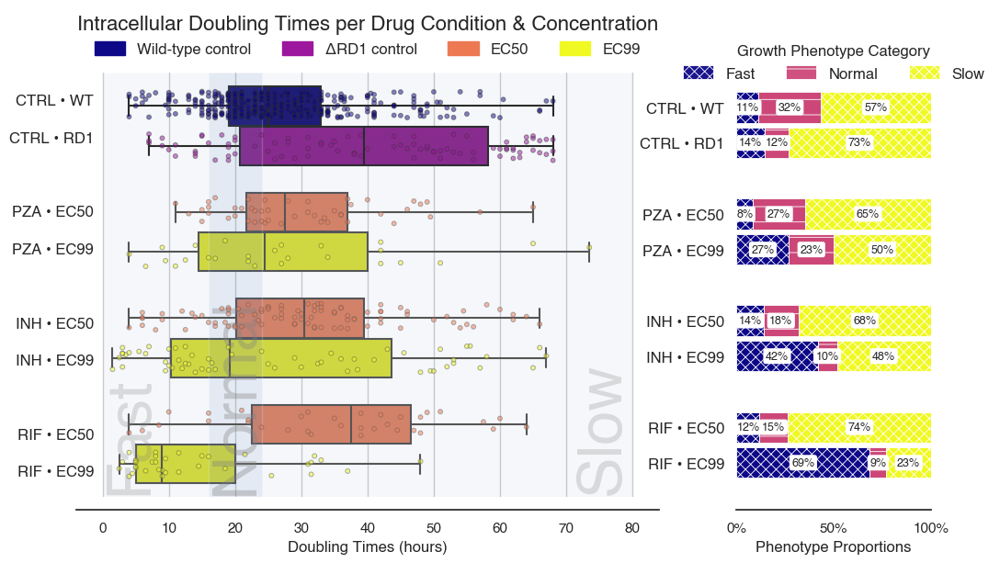

Plotting with cmap=cividis, hatches=('xxx', '-', 'xxx')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


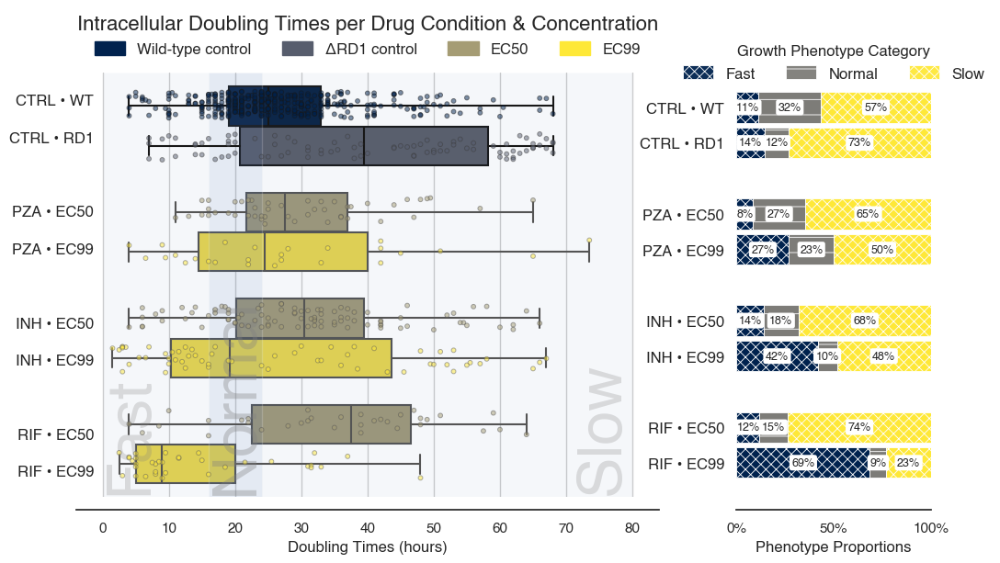

Plotting with cmap=coolwarm, hatches=('xxx', '-', 'xxx')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


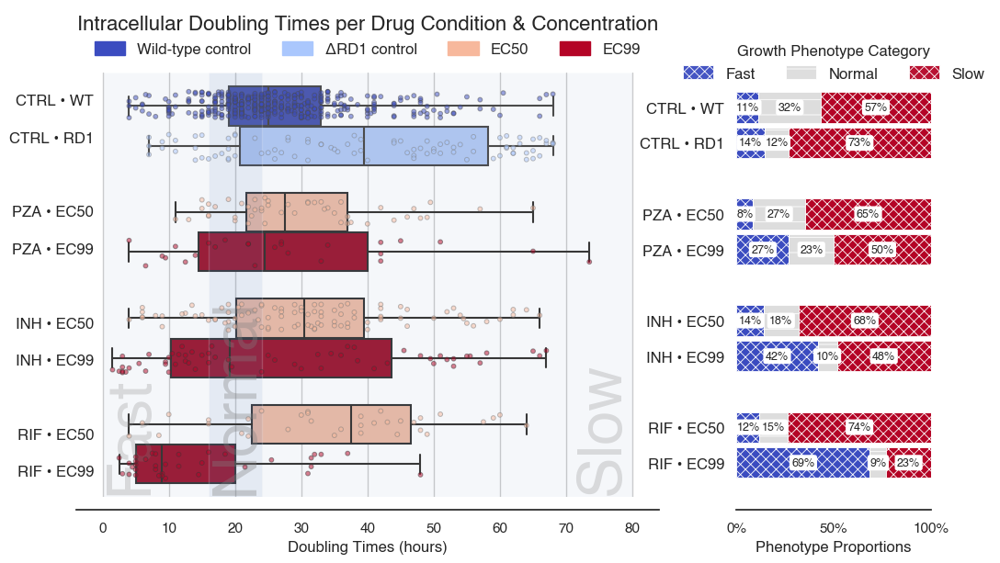

Plotting with cmap=viridis, hatches=('xxx', '-', 'xxx')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


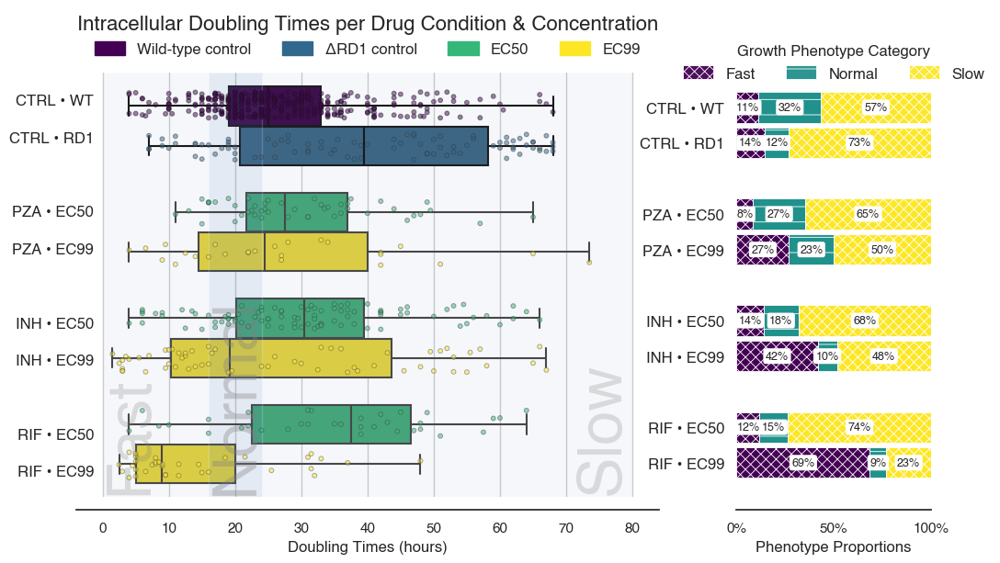

Plotting with cmap=PiYG_r, hatches=('xxx', '-', 'xxx')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


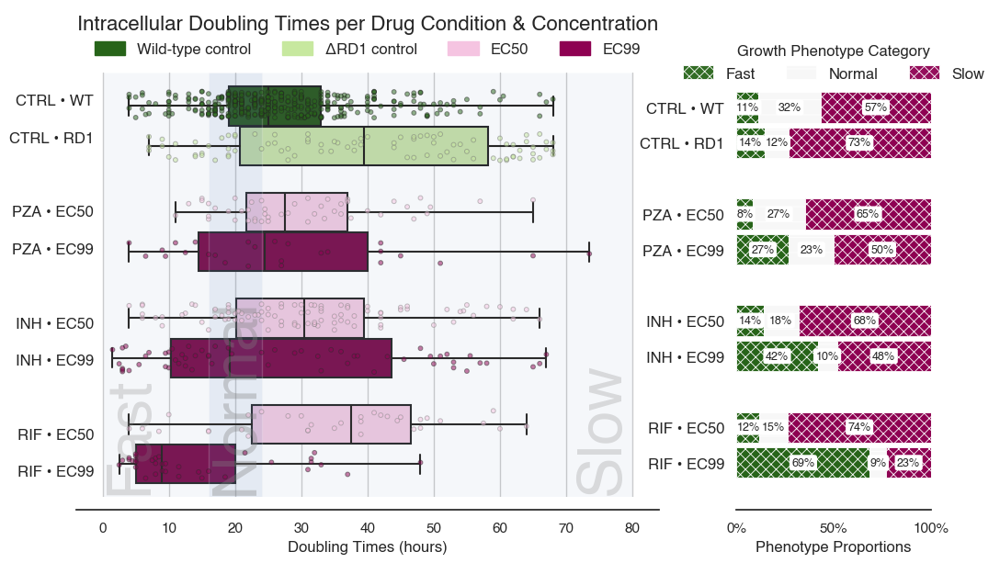

Plotting with cmap=rocket, hatches=('xxx', '-', 'xxx')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


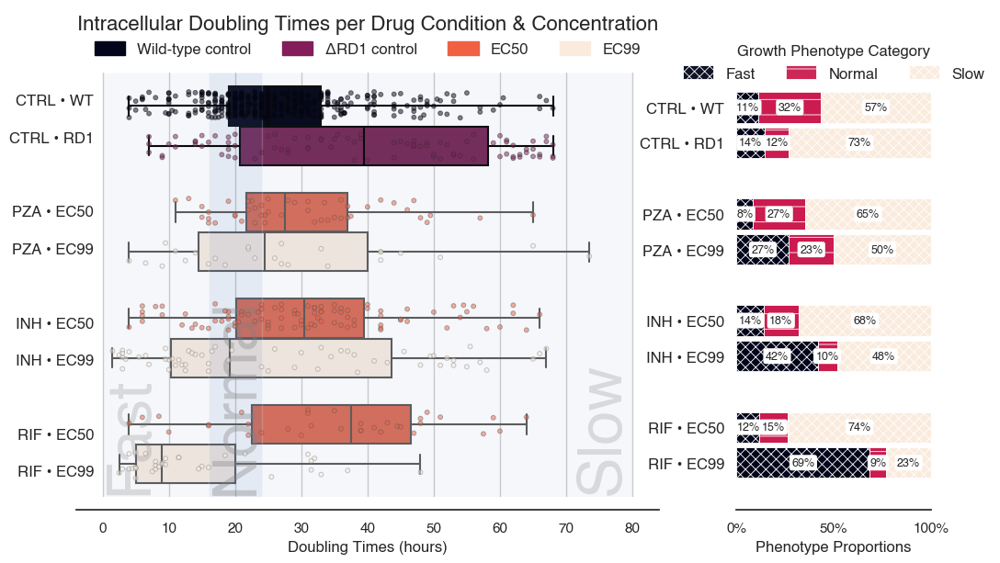

Plotting with cmap=flare, hatches=('xxx', '-', 'xxx')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


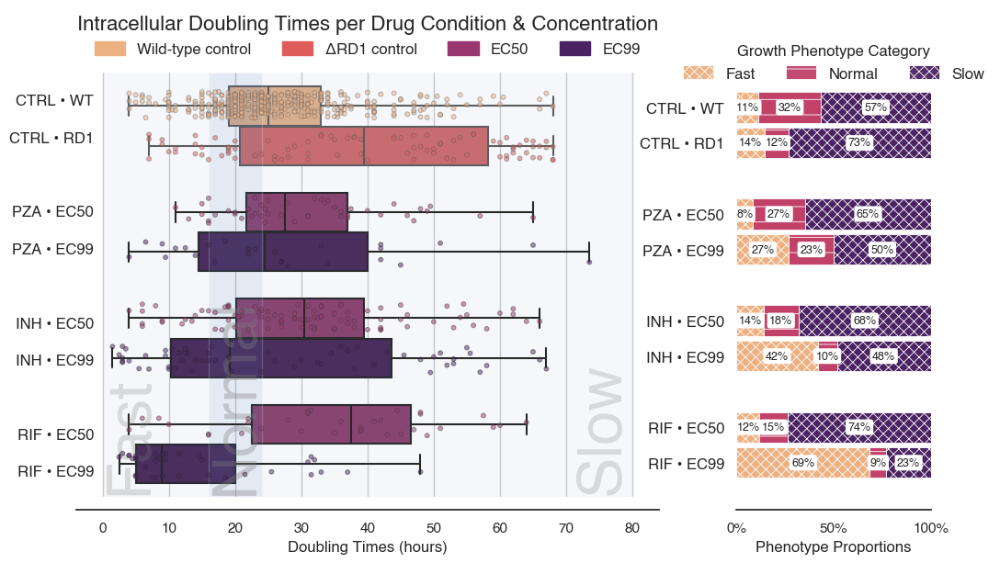

Plotting with cmap=crest, hatches=('xxx', '-', 'xxx')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


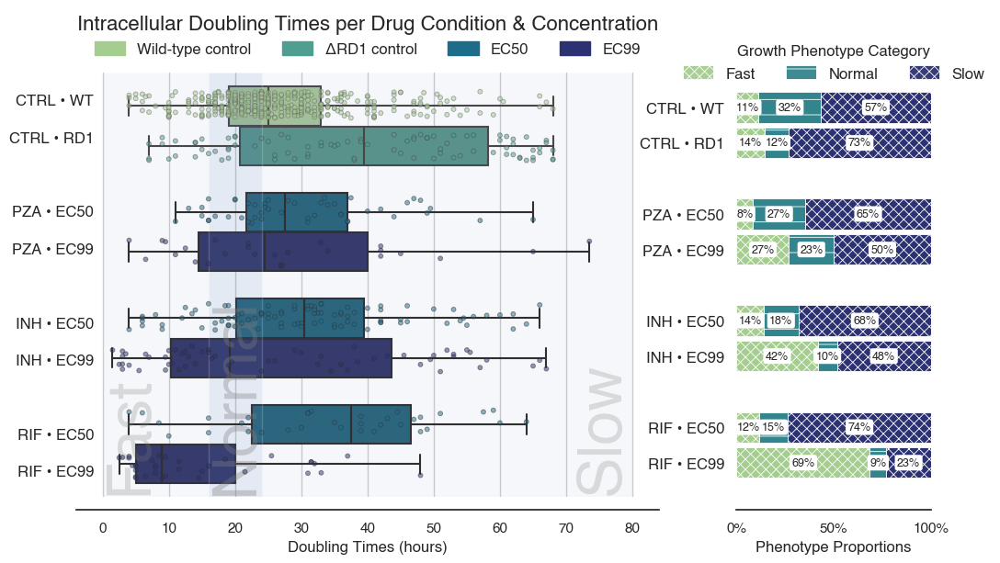

Plotting with cmap=Spectral, hatches=('xxx', '-', 'xxx')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


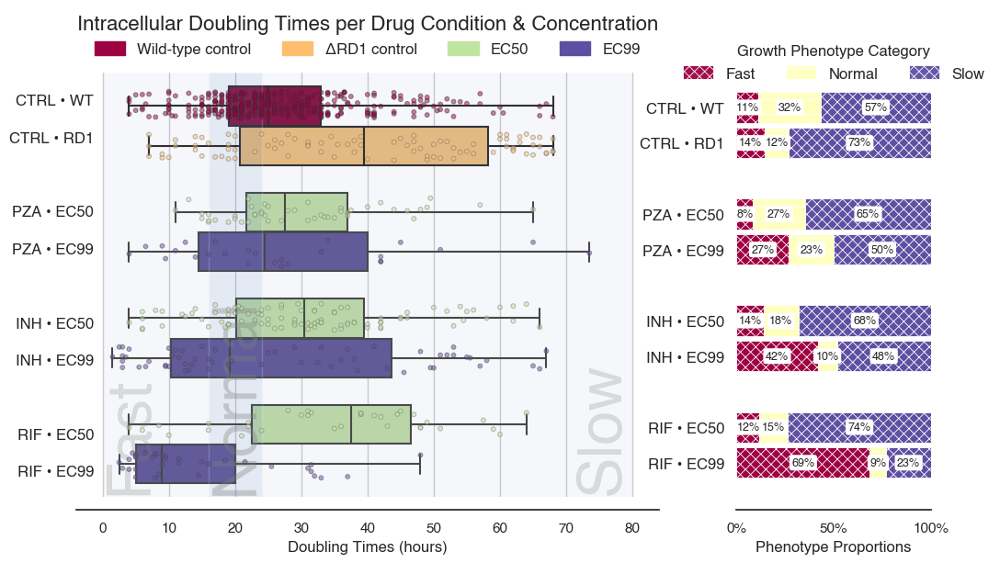

Plotting with cmap=RdYlGn, hatches=('xxx', '-', 'xxx')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


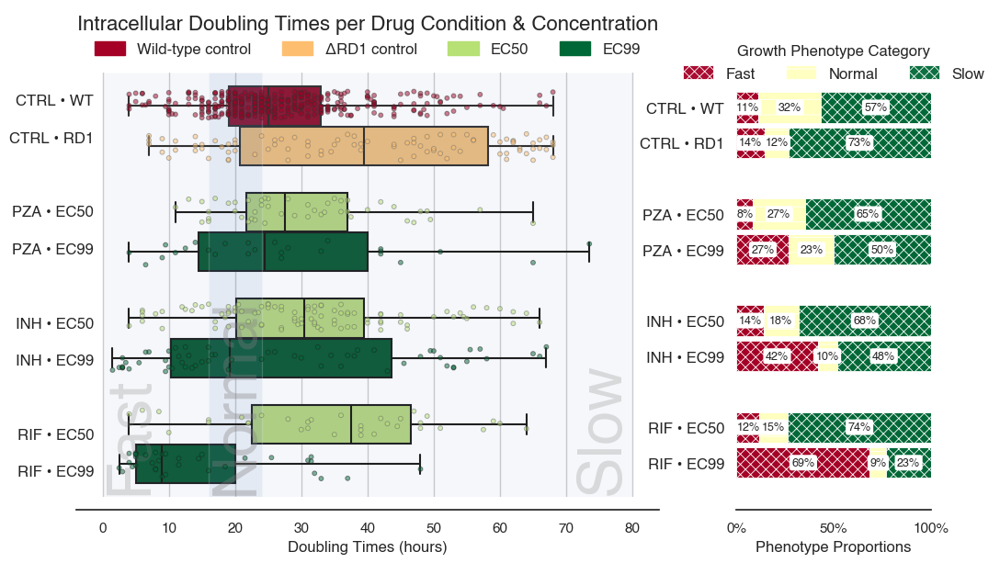

Plotting with cmap=YlOrBr, hatches=('xxx', '-', 'xxx')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


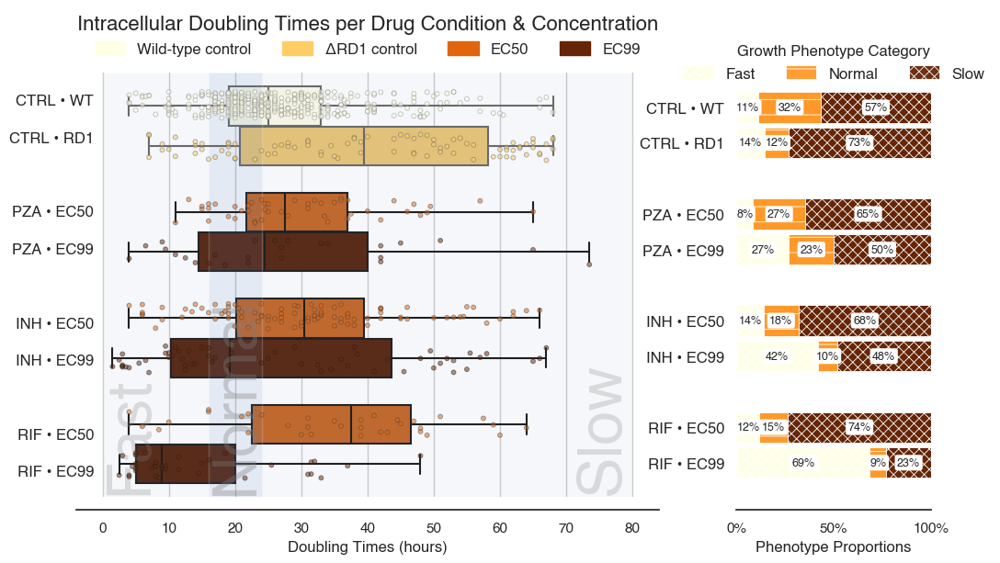

Plotting with cmap=cubehelix, hatches=('xxx', '-', 'xxx')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


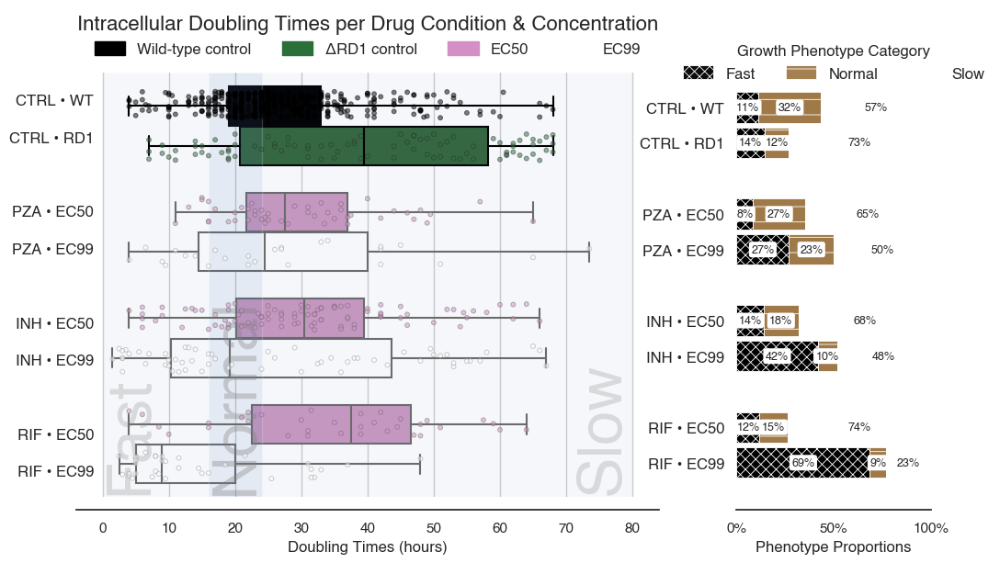

Plotting with cmap=mako, hatches=('++', '--', '++')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


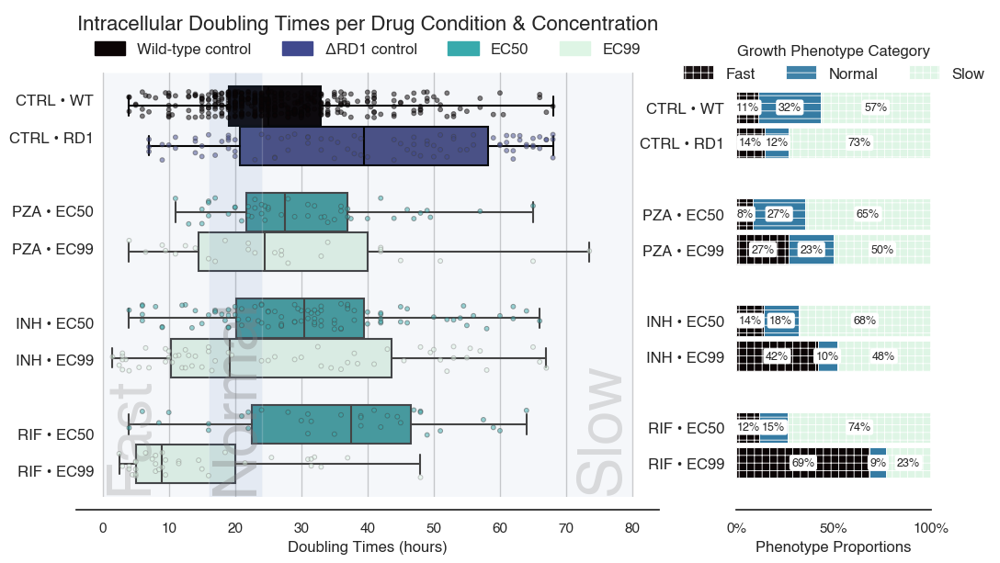

Plotting with cmap=inferno, hatches=('++', '--', '++')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


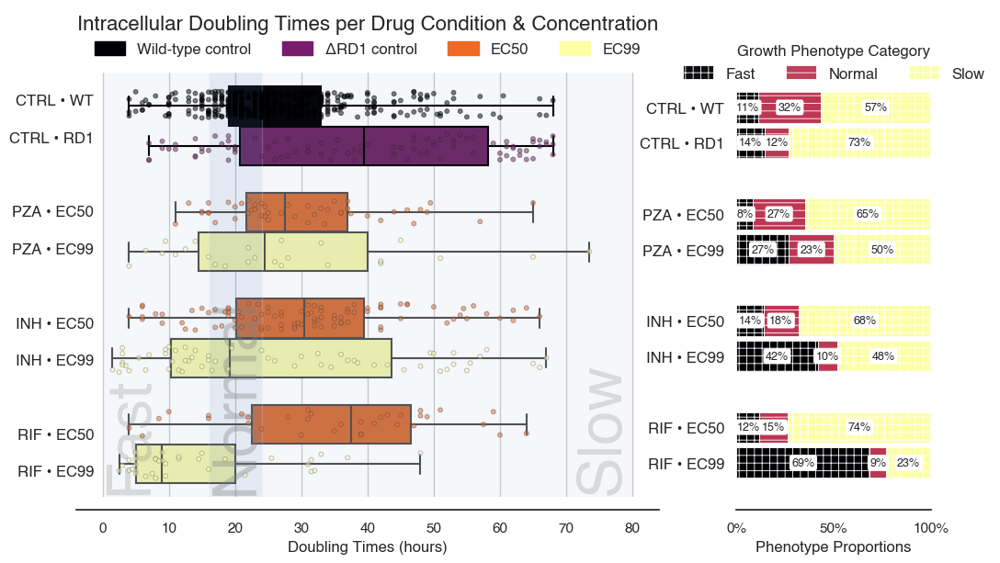

Plotting with cmap=plasma, hatches=('++', '--', '++')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


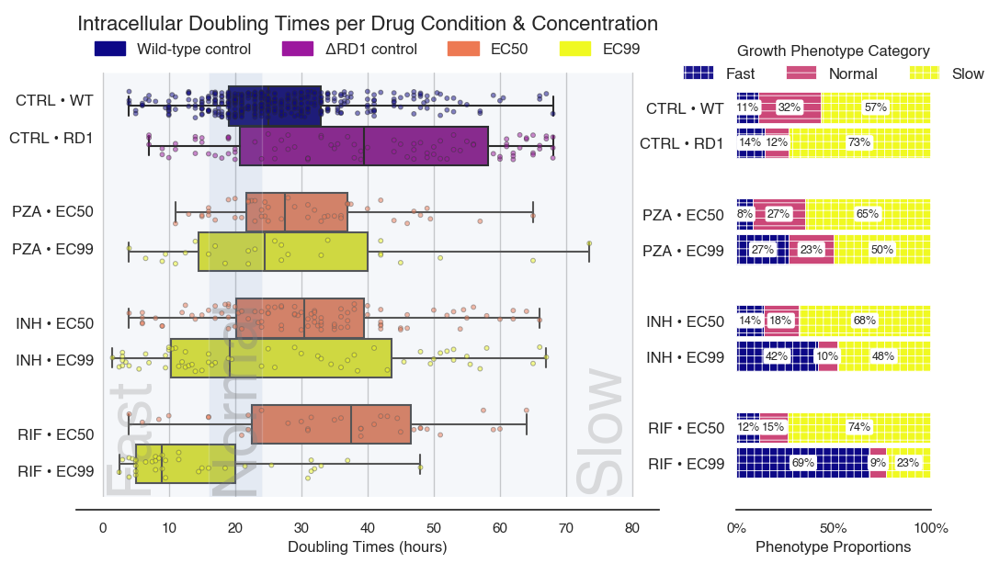

Plotting with cmap=cividis, hatches=('++', '--', '++')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


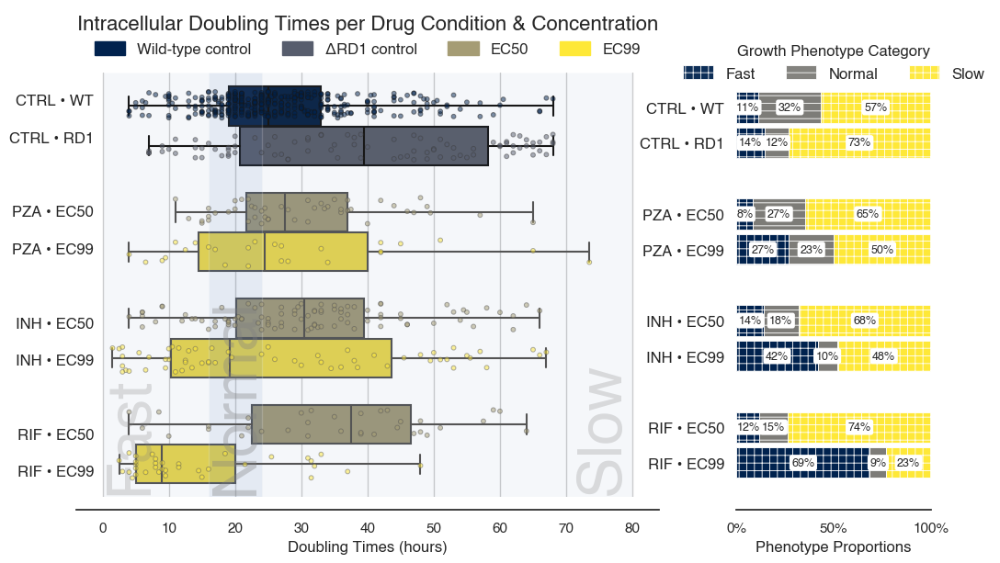

Plotting with cmap=coolwarm, hatches=('++', '--', '++')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


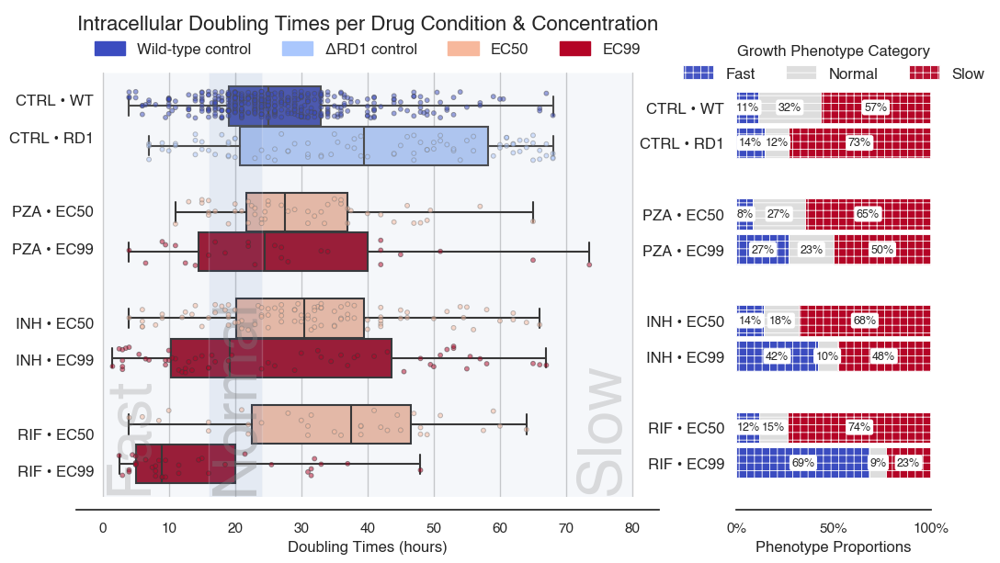

Plotting with cmap=viridis, hatches=('++', '--', '++')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


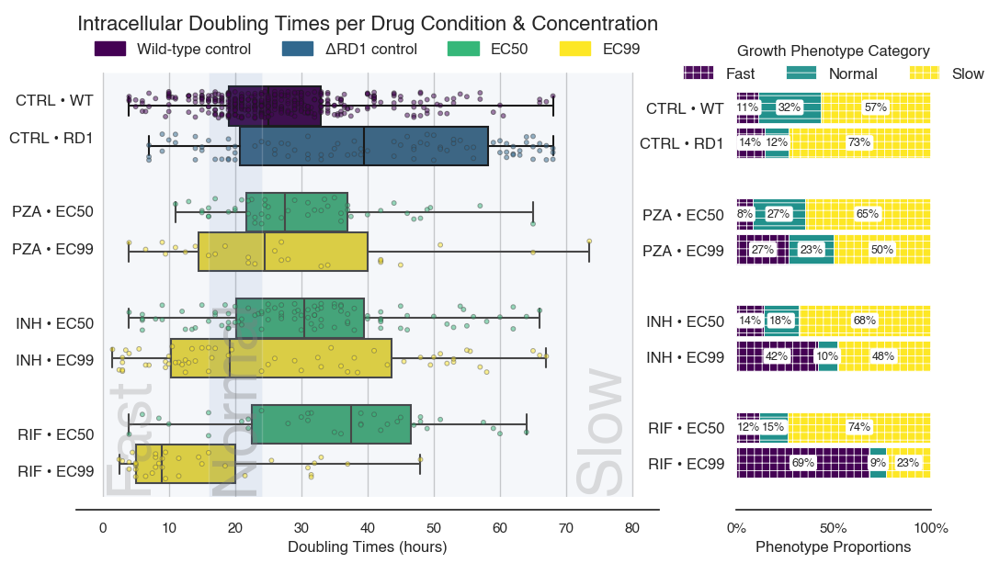

Plotting with cmap=PiYG_r, hatches=('++', '--', '++')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


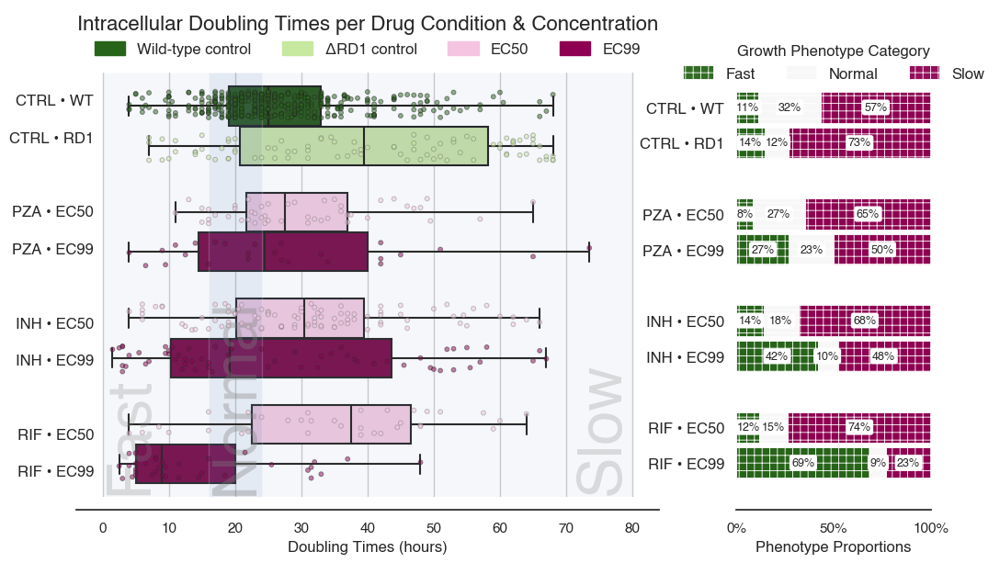

Plotting with cmap=rocket, hatches=('++', '--', '++')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


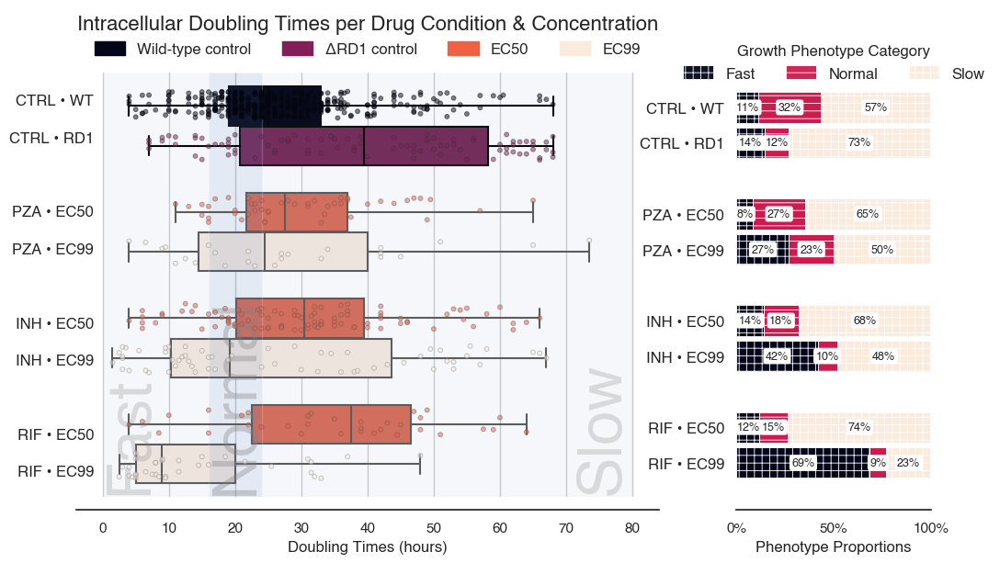

Plotting with cmap=flare, hatches=('++', '--', '++')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


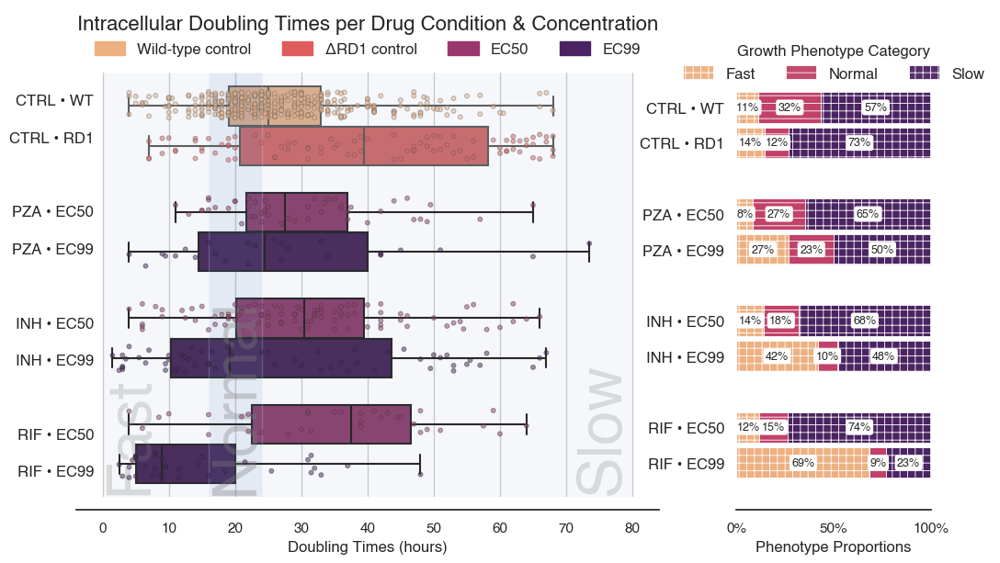

Plotting with cmap=crest, hatches=('++', '--', '++')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


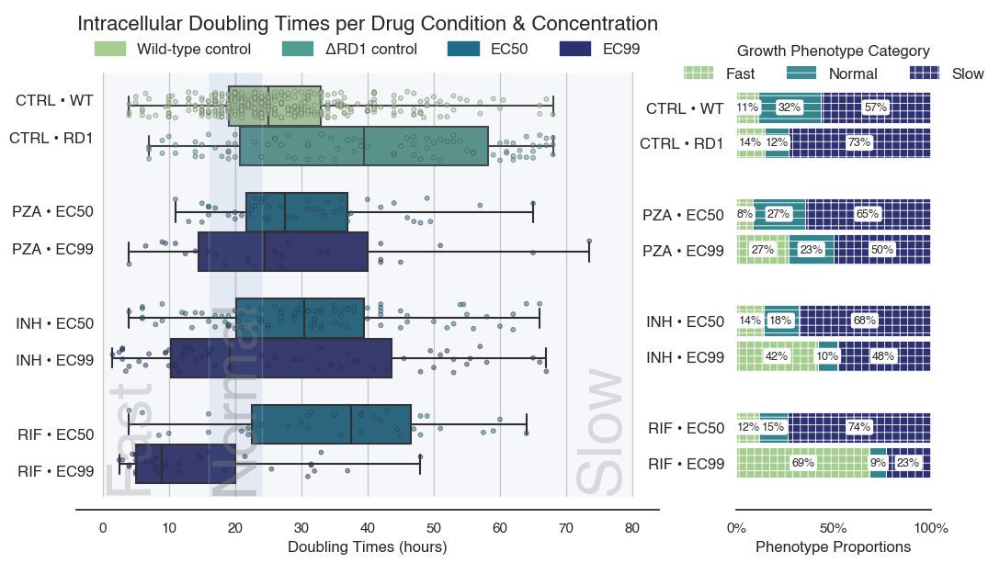

Plotting with cmap=Spectral, hatches=('++', '--', '++')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


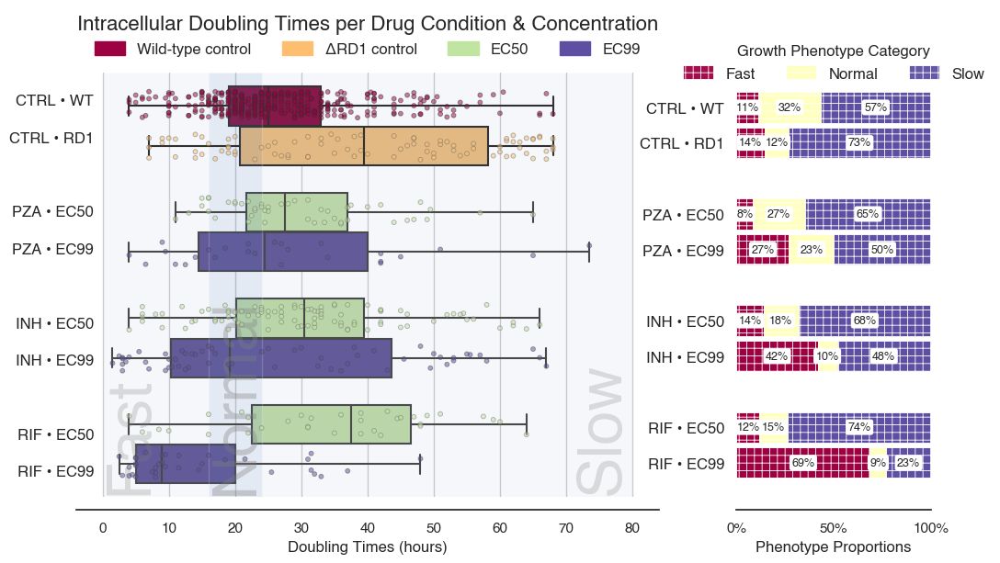

Plotting with cmap=RdYlGn, hatches=('++', '--', '++')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


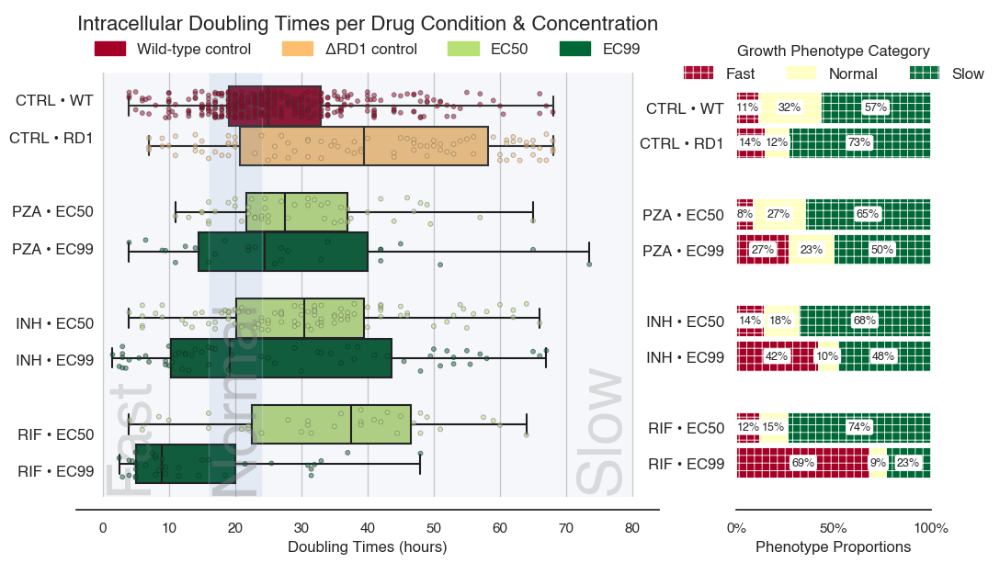

Plotting with cmap=YlOrBr, hatches=('++', '--', '++')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


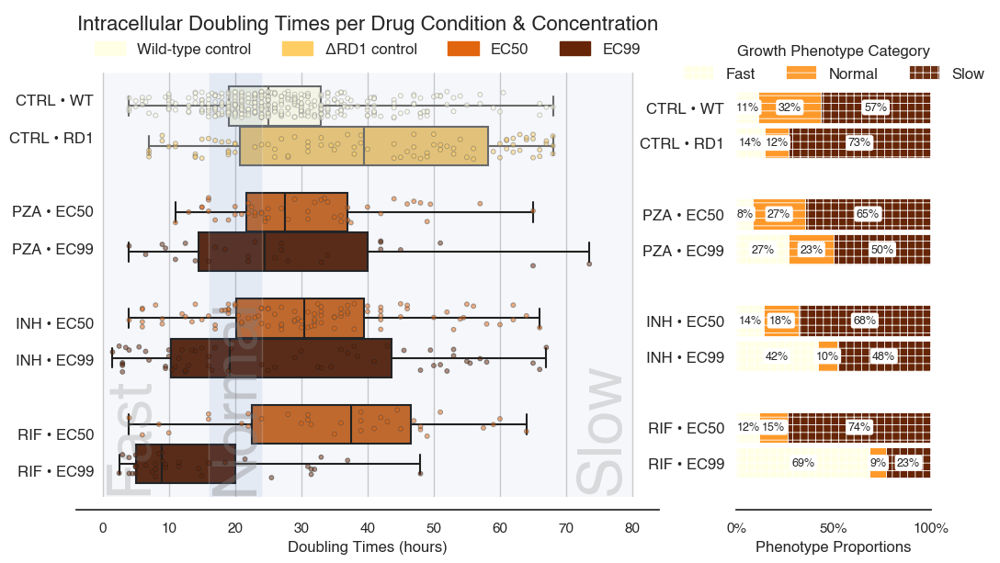

Plotting with cmap=cubehelix, hatches=('++', '--', '++')


/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2403510747.py:19: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(cmap_spec)
/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_56184/2182429968.py:97: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(bar_cmap, len(growth_order))


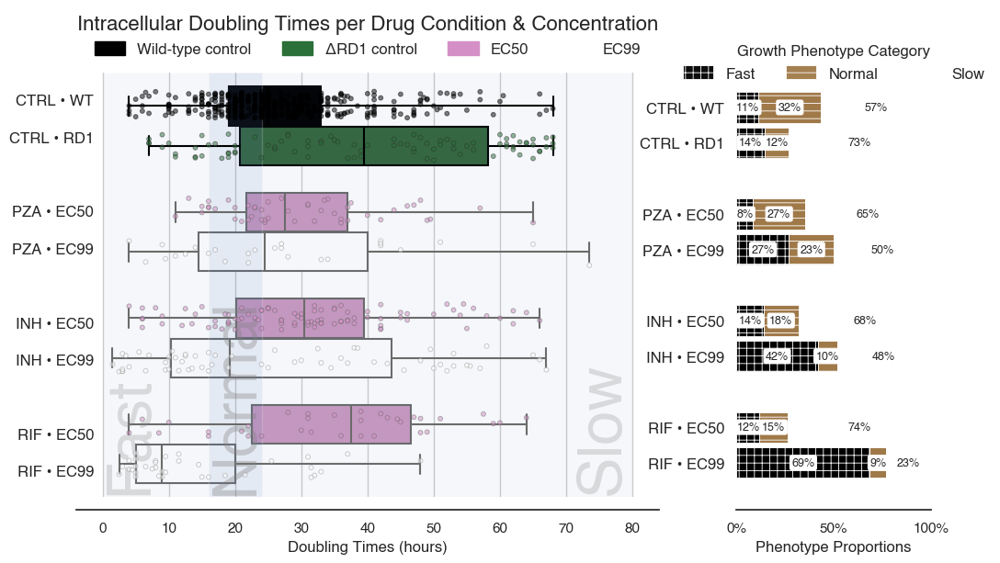

In [219]:
# Colormaps to try
cmap_list = [
    # your originals
    "mako", "inferno", "plasma", "cividis", "coolwarm", "viridis", "PiYG_r",
    # more perceptually distinct maps
    "rocket", "flare", "crest", "Spectral", "RdYlGn", "YlOrBr", "cubehelix"
]
# Hatch sets to try
hatch_sets = [
    ("//", "---", "\\"),
    ("xxx", "-", "xxx"),
    ("++", "--", "++")
]

# Iterate over all combinations

for hatches in hatch_sets:
    for cmap in cmap_list:
        print(f"Plotting with cmap={cmap}, hatches={hatches}")
        doubling_times_with_stacked_bars(
            subset_df,
            box_cmap=cmap,
            bar_cmap=cmap,
            hatch_patterns=hatches,
            hatch_edgecolor="white",
            hatch_linewidth=0.6
        )